In [1]:
from Utils.preprocessing import *
from Utils.customPipelines import *

from sklearn import metrics
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_absolute_error
from bs4 import BeautifulSoup
from tqdm.asyncio import tqdm_asyncio
from datetime import date

import matplotlib.pyplot as plt
import matplotlib.cm
import seaborn as sns
import colorcet as cc
import itertools
import pandas as pd
import nest_asyncio
import aiohttp
import asyncio
import requests

sns.set(style='ticks')

RANDOM_STATE = 632

# 1. Sample datasets

In [2]:
sample_data_a = pd.read_csv("Data//jobs_in_data.csv")
sample_data_b = pd.read_csv("Data//QF632_Project_2_b.csv")
sample_data_c = pd.read_csv("Data//QF632_Project_2_c.csv")
sample_data_d = pd.read_csv("Data//Glassdoor_Salary_Cleaned_Version.csv")

In [3]:
sample_data_comb = pd.concat([sample_data_a, sample_data_b, sample_data_c])

# Standardise job title and type
roles = {"data scientist": ["scientist", "science", "statistics"],
         "data analyst":["analyst", "analysis", "analytics"],
         "data insights":["bi", "visual", "business intelligence"],
         "machine learning":["ml", "machine", "ai", "autonomous"],
         "research scientist":["research"],
         "data architect":["architect"],
         "data engineer":["engineer", "developer"],
         "data product":["product"],
         "cloud and database":["cloud"],
         "data management":["data", "database"],
         }
sample_data_comb["job_title"] = sample_data_comb["job_title"].astype(str)
sample_data_comb["job_category"] = sample_data_comb["job_category"].astype(str)

for ind in range(len(sample_data_comb)):
    row = sample_data_comb.iloc[ind]
    if pd.isna(row["job_category"]) != str or row["job_category"].lower() == "nan":
        job = row["job_title"]
        for role in roles:
            if any(sub.lower() in job.lower() for sub in roles[role]):
                sample_data_comb.iloc[ind, sample_data_comb.columns.get_loc("job_category")] = role
                break

sample_data_comb["job_category"] = sample_data_comb["job_category"].apply(lambda x: x.lower() if type(x) == str else x)
sample_data_comb["job_category"] = np.where(sample_data_comb["job_category"] == "data science and research", "data scientist", sample_data_comb["job_category"])
sample_data_comb["job_category"] = np.where(sample_data_comb["job_category"] == "data engineering", "data engineer", sample_data_comb["job_category"])
sample_data_comb["job_category"] = np.where(sample_data_comb["job_category"] == "data architecture and modeling", "data architect", sample_data_comb["job_category"])
sample_data_comb["job_category"] = np.where(sample_data_comb["job_category"] == "machine learning and ai", "machine learning", sample_data_comb["job_category"])
sample_data_comb["job_category"] = np.where(sample_data_comb["job_category"] == "data analysis", "data analyst", sample_data_comb["job_category"])
sample_data_comb["job_category"] = np.where(sample_data_comb["job_category"] == "bi and visualization", "data insights", sample_data_comb["job_category"])
sample_data_comb["job_category"] = np.where(sample_data_comb["job_category"] == "bi and visualization", "data insights", sample_data_comb["job_category"])
sample_data_comb["job_category"] = np.where(sample_data_comb["job_category"] == "data management and strategy", "data management", sample_data_comb["job_category"])
sample_data_comb["job_category"] = np.where(sample_data_comb["job_category"] == "leadership and management", np.nan, sample_data_comb["job_category"])

# Standardise experience level            
sample_data_comb["experience_level"] = np.where(sample_data_comb["experience_level"].str.contains("Mid"), "Mid", sample_data_comb["experience_level"])
sample_data_comb["experience_level"] = np.where(sample_data_comb["experience_level"].str.contains("Senior"), "Senior", sample_data_comb["experience_level"])
sample_data_comb["experience_level"] = np.where((sample_data_comb["experience_level"].str.contains("Entry") | (sample_data_comb["experience_level"].str.contains("Executive"))), "Entry", sample_data_comb["experience_level"])
sample_data_comb["experience_level"] = np.where(sample_data_comb["experience_level"] == "MI", "Mid", sample_data_comb["experience_level"])
sample_data_comb["experience_level"] = np.where(sample_data_comb["experience_level"] == "SE", "Senior", sample_data_comb["experience_level"])
sample_data_comb["experience_level"] = np.where((sample_data_comb["experience_level"] == "EN") | (sample_data_comb["experience_level"] == "EX"), "Entry", sample_data_comb["experience_level"])

# Standardise company location and employee location
countries = {
    'AD': 'Andorra',
    'AE': 'United Arab Emirates',
    'AM': 'Armenia',
    'AR': 'Argentina',
    'AS': 'American Samoa',
    'AT': 'Austria',
    'AU': 'Australia',
    'BA': 'Bosnia and Herzegovina',
    'BE': 'Belgium',
    'BR': 'Brazil',
    'BS': 'Bahamas',
    'CA': 'Canada',
    'CF': 'Central African Republic',
    'CH': 'Switzerland',
    'CL': 'Chile',
    'CN': 'China',
    'CO': 'Colombia',
    'CZ': 'Czech Republic',
    'DE': 'Germany',
    'DK': 'Denmark',
    'DZ': 'Algeria',
    'EC': 'Ecuador',
    'EE': 'Estonia',
    'EG': 'Egypt',
    'ES': 'Spain',
    'FI': 'Finland',
    'FR': 'France',
    'GB': 'United Kingdom',
    'GH': 'Ghana',
    'GI': 'Gibraltar',
    'GR': 'Greece',
    'HK': 'Hong Kong',
    'HN': 'Honduras',
    'HR': 'Croatia',
    'HU': 'Hungary',
    'ID': 'Indonesia',
    'IE': 'Ireland',
    'IL': 'Israel',
    'IN': 'India',
    'IQ': 'Iraq',
    'IR': 'Iran',
    'IT': 'Italy',
    'JP': 'Japan',
    'KE': 'Kenya',
    'KR': 'South Korea',
    'LT': 'Lithuania',
    'LU': 'Luxembourg',
    'LV': 'Latvia',
    'MD': 'Moldova',
    'MT': 'Malta',
    'MU': 'Mauritius',
    'MX': 'Mexico',
    'MY': 'Malaysia',
    'NG': 'Nigeria',
    'NL': 'Netherlands',
    'NO': 'Norway',
    'NZ': 'New Zealand',
    'PH': 'Philippines',
    'PK': 'Pakistan',
    'PL': 'Poland',
    'PR': 'Puerto Rico',
    'PT': 'Portugal',
    'QA': 'Qatar',
    'RO': 'Romania',
    'RU': 'Russia',
    'SA': 'Saudi Arabia',
    'SE': 'Sweden',
    'SG': 'Singapore',
    'SI': 'Slovenia',
    'TH': 'Thailand',
    'TR': 'Turkey',
    'UA': 'Ukraine',
    'US': 'United States',
    'VN': 'Vietnam',
    'ZA': 'South Africa'
}

sample_data_comb['company_location'] = sample_data_comb['company_location'].apply(lambda x: countries[x] if x in countries else x)
sample_data_comb['employee_location'] = sample_data_comb['employee_residence'].apply(lambda x: countries[x] if x in countries else x)

# Standardise company_size
sample_data_comb["company_size"] = np.where(sample_data_comb["company_size"] == "Large", "L", sample_data_comb["company_size"])
sample_data_comb["company_size"] = np.where(sample_data_comb["company_size"] == "Medium", "M", sample_data_comb["company_size"])
sample_data_comb["company_size"] = np.where(sample_data_comb["company_size"] == "Small", "S", sample_data_comb["company_size"])

# Standardise salary
sample_data_comb["salary_in_usd"] = pd.to_numeric(sample_data_comb["salary_in_usd"])/1000
sample_data_comb["salary_in_usd"] = sample_data_comb["salary_in_usd"].round(2)

# Standardise employment type
sample_data_comb["employment_type"] = sample_data_comb["employment_type"].apply(lambda x: "FT" if x.lower() == "full-time" else x)
sample_data_comb["employment_type"] = sample_data_comb["employment_type"].apply(lambda x: "PT" if x.lower() == "part-time" else x)
sample_data_comb["employment_type"] = sample_data_comb["employment_type"].apply(lambda x: "CT" if x.lower() == "contract" else x)
sample_data_comb["employment_type"] = sample_data_comb["employment_type"].apply(lambda x: "FL" if x.lower() == "freelance" else x)

# Drop unnecessary columns
sample_data_comb = sample_data_comb.rename(columns={"work_year": "YEAR", "job_title": "JOB TITLE", "job_category": "TYPE", "salary_in_usd": "y",
                                                    "experience_level": "EXP", "company_location": "COMPANY LOCATION", "employee_location": "EMPLOYEE LOCATION", "company_size": "EMPLOYER SIZE", "employment_type": "EMPLOYMENT TYPE", "work_setting": "WORK SETTING", "remote_ratio": "REMOTE RATIO", "work_models": "WORK MODELS"})

sample_data_comb.reset_index(drop=True, inplace=True)
sample_data_comb = sample_data_comb.applymap(lambda x: x.upper() if isinstance(x, str) else x)

full_sample_data_comb = sample_data_comb.copy()[['YEAR', 'JOB TITLE', 'TYPE', 'COMPANY LOCATION', 'EMPLOYEE LOCATION', 'EMPLOYER SIZE', 'y', 'EXP', 'EMPLOYMENT TYPE', 'WORK SETTING', 'REMOTE RATIO', 'WORK MODELS']]
sample_data_comb = sample_data_comb.copy()[['YEAR', 'JOB TITLE', 'TYPE', 'COMPANY LOCATION', 'EMPLOYEE LOCATION', 'EMPLOYER SIZE', 'y', 'EXP']]

print(sample_data_comb.shape)
sample_data_comb

(26624, 8)


,YEAR,JOB TITLE,TYPE,COMPANY LOCATION,EMPLOYEE LOCATION,EMPLOYER SIZE,y,EXP
0,2023,DATA DEVOPS ENGINEER,DATA ENGINEER,GERMANY,GERMANY,L,95.01,MID
1,2023,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,UNITED STATES,M,186.00,SENIOR
2,2023,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,UNITED STATES,M,81.80,SENIOR
3,2023,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,UNITED STATES,M,212.00,SENIOR
4,2023,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,UNITED STATES,M,93.30,SENIOR
...,...,...,...,...,...,...,...,...
26619,2020,STAFF DATA ANALYST,DATA ANALYST,CANADA,CANADA,L,44.75,ENTRY
26620,2020,STAFF DATA ANALYST,DATA ANALYST,CANADA,NIGERIA,M,15.00,ENTRY
26621,2020,MACHINE LEARNING MANAGER,MACHINE LEARNING,CANADA,CANADA,L,117.10,SENIOR
26622,2020,DATA ENGINEER,DATA ENGINEER,AUSTRIA,AUSTRIA,L,74.13,MID


In [4]:
# Check for missing values
na_values = full_sample_data_comb.isna().sum()
columns_na = na_values[na_values > 0]

if not columns_na.empty:
    print(f"Columns with missing values and value count:\n{columns_na}")
    print(f"No of columns with missing values: {len(columns_na)}")
else:
    print("No columns with missing values")

# Check for inconsistent data types
def check_types(df):
    wrong_columns = {}
    for column in df.columns:
        unique_types = df[column].apply(type).unique()
        if len(unique_types) > 1:
            wrong_columns[column] = unique_types
    return wrong_columns

wrong_types = check_types(sample_data_comb)

for column, types in wrong_types.items():
    print(f"Column '{column}' has {len(types)} types: {types}")
    print(f"No. of inconsistent data types: {len(wrong_types)}")

if not wrong_types:
    print("No columns with inconsistent data types")

Columns with missing values and value count:
WORK SETTING    17269
REMOTE RATIO    15954
WORK MODELS     20025
dtype: int64
No of columns with missing values: 3
No columns with inconsistent data types


In [5]:
sample_data_d_temp = sample_data_d.copy()

#Standardise employer
sample_data_d_temp["EMPLOYER"] = sample_data_d_temp["Company Name"].str.replace(r'\n.*', '', regex=True)
sample_data_d_temp["EMPLOYER"] = sample_data_d_temp["EMPLOYER"].str.replace(r'\r', '', regex=True)

# Standardise job title and type
job_categories = []
for ind in range(len(sample_data_d_temp)):
    row = sample_data_d_temp.iloc[ind]
    job = row["Job Title"]
    role_not_found = True
    for role in roles:
        if any(sub.lower() in roles[role] for sub in job.split(" ")):
            job_categories.append(role)
            role_not_found = False
            break
    if role_not_found:
        job_categories.append(np.nan)

sample_data_d_temp["TYPE"] = job_categories
sample_data_d_temp["TYPE"] = sample_data_d_temp["TYPE"].fillna("others")

# Standardise company location and employee location
sample_data_d_temp['COMPANY LOCATION'] = 'UNITED STATES'
sample_data_d_temp['COMPANY STATE'] = sample_data_d_temp['Location'].apply(lambda x: x.split(", ")[1] if len(x.split(", ")) > 1 else x)
sample_data_d_temp['EMPLOYEE LOCATION'] = 'UNITED STATES'
sample_data_d_temp['EMPLOYEE STATE'] = sample_data_d_temp['job_state']


# Standardise salary
sample_data_d_temp["y"] = pd.to_numeric(sample_data_d_temp["avg_salary"])
sample_data_d_temp["y"] = sample_data_d_temp["y"].round(2)

# Standardise employer size
sample_data_d_temp["EMPLOYER SIZE"] = "L"
sample_data_d_temp["EMPLOYER SIZE"] = np.where((sample_data_d_temp["Size"] == "1 to 50 employees") | (sample_data_d_temp["Size"] == "51 to 200 employees"),
                                               "S", sample_data_d_temp["EMPLOYER SIZE"])
sample_data_d_temp["EMPLOYER SIZE"] = np.where((sample_data_d_temp["Size"] == "201 to 500 employees") | (sample_data_d_temp["Size"] == "501 to 1000 employees"),
                                               "M", sample_data_d_temp["EMPLOYER SIZE"])
sample_data_d_temp["EMPLOYER SIZE"] = np.where((sample_data_d_temp["Size"] == "Unknown") | (sample_data_d_temp["Size"] == "-1"),
                                               "Unknown", sample_data_d_temp["EMPLOYER SIZE"])

# Standardise experience
exp = {"Mid":["II", "2", "&", "SPECIALIST", "ADVANCED", "LEAD", "MID"], "Senior":["III", "3", "SR", "SNR", "SENIOR", "PROFESSOR", "MANAGE", "MANAGER", "MANAGEMENT", "MGR", "PHD", "DIRECTOR", "IV", "V", "4", "5", "LEADER", "HEAD"]}
exp_level = []

for job in sample_data_d_temp["Job Title"]:
    if any(sub in exp["Senior"] for sub in job.split(" ")):
        exp_level.append("Senior")
    elif any(sub in exp["Mid"] for sub in job.split(" ")):
        exp_level.append("Mid")
    else:
        exp_level.append("Entry")

sample_data_d_temp["EXP"] = exp_level

# Drop unnecessary columns
sample_data_d_temp = sample_data_d_temp.drop(columns=["Salary Estimate", "Job Description", "Rating", "Headquarters", "Founded", "Type of ownership", "Industry", "Sector", "Size", 'Revenue', 'Competitors', 'hourly', 'min_salary', 'max_salary', 'same_state', 'age', 'python_yn', 'R_yn','spark', 'aws', 'excel', "employer_provided", "avg_salary", "Company Name"])
sample_data_d_temp = sample_data_d_temp.rename(columns={"Job Title": "JOB TITLE", "job_state": "STATE"})

sample_data_d_temp = sample_data_d_temp[['EMPLOYER', 'JOB TITLE', 'TYPE', 'COMPANY LOCATION', 'COMPANY STATE', 'EMPLOYEE LOCATION', 'EMPLOYEE STATE', 'EMPLOYER SIZE', 'y', 'EXP']]

sample_data_d_temp.reset_index(drop=True, inplace=True)
sample_data_d_temp = sample_data_d_temp.applymap(lambda x: x.upper() if isinstance(x, str) else x)
print(sample_data_d_temp.shape)
sample_data_d_temp

(742, 10)


,EMPLOYER,JOB TITLE,TYPE,COMPANY LOCATION,COMPANY STATE,EMPLOYEE LOCATION,EMPLOYEE STATE,EMPLOYER SIZE,y,EXP
0,TECOLOTE RESEARCH,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,NM,UNITED STATES,NM,M,72.0,ENTRY
1,UNIVERSITY OF MARYLAND MEDICAL SYSTEM,HEALTHCARE DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,MD,UNITED STATES,MD,L,87.5,ENTRY
2,KNOWBE4,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,FL,UNITED STATES,FL,M,85.0,ENTRY
3,PNNL,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,WA,UNITED STATES,WA,L,76.5,ENTRY
4,AFFINITY SOLUTIONS,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,NY,UNITED STATES,NY,S,114.5,ENTRY
...,...,...,...,...,...,...,...,...,...,...
737,GSK,"SR SCIENTIST, IMMUNO-ONCOLOGY - ONCOLOGY",OTHERS,UNITED STATES,MA,UNITED STATES,MA,L,84.5,ENTRY
738,EVENTBRITE,SENIOR DATA ENGINEER,DATA ENGINEER,UNITED STATES,TN,UNITED STATES,TN,L,102.5,ENTRY
739,SOFTWARE ENGINEERING INSTITUTE,"PROJECT SCIENTIST - AUTON LAB, ROBOTICS INSTITUTE",DATA SCIENTIST,UNITED STATES,PA,UNITED STATES,PA,M,73.5,ENTRY
740,"NUMERIC, LLC",DATA SCIENCE MANAGER,DATA SCIENTIST,UNITED STATES,PA,UNITED STATES,PA,S,127.5,ENTRY


In [6]:
# Check for missing values
na_values = sample_data_d_temp.isna().sum()
columns_na = na_values[na_values > 0]

if not columns_na.empty:
    print(f"Columns with missing values and value count:\n{columns_na}")
    print(f"No of columns with missing values: {len(columns_na)}")
else:
    print("No columns with missing values")

# Check for inconsistent data types
def check_types(df):
    wrong_columns = {}
    for column in df.columns:
        unique_types = df[column].apply(type).unique()
        if len(unique_types) > 1:
            wrong_columns[column] = unique_types
    return wrong_columns

wrong_types = check_types(sample_data_d_temp)

for column, types in wrong_types.items():
    print(f"Column '{column}' has {len(types)} types: {types}")
    print(f"No. of inconsistent data types: {len(wrong_types)}")

if not wrong_types:
    print("No columns with inconsistent data types")

No columns with missing values
No columns with inconsistent data types


In [7]:
sample_df = pd.concat([sample_data_comb, sample_data_d_temp], ignore_index=True)
sample_df = sample_df[['YEAR', 'EMPLOYER', 'JOB TITLE', 'TYPE', 'COMPANY LOCATION', 'COMPANY STATE', 'EMPLOYEE LOCATION', 'EMPLOYEE STATE', 'EMPLOYER SIZE', 'y', 'EXP']]

# Standardise year for changed data types
sample_df["YEAR"] = sample_df["YEAR"].astype('Int64')

print(sample_df.shape)
sample_df

(27366, 11)


,YEAR,EMPLOYER,JOB TITLE,TYPE,COMPANY LOCATION,COMPANY STATE,EMPLOYEE LOCATION,EMPLOYEE STATE,EMPLOYER SIZE,y,EXP
0,2023,NaN,DATA DEVOPS ENGINEER,DATA ENGINEER,GERMANY,NaN,GERMANY,NaN,L,95.01,MID
1,2023,NaN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,NaN,UNITED STATES,NaN,M,186.00,SENIOR
2,2023,NaN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,NaN,UNITED STATES,NaN,M,81.80,SENIOR
3,2023,NaN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,NaN,UNITED STATES,NaN,M,212.00,SENIOR
4,2023,NaN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,NaN,UNITED STATES,NaN,M,93.30,SENIOR
...,...,...,...,...,...,...,...,...,...,...,...
27361,<NA>,GSK,"SR SCIENTIST, IMMUNO-ONCOLOGY - ONCOLOGY",OTHERS,UNITED STATES,MA,UNITED STATES,MA,L,84.50,ENTRY
27362,<NA>,EVENTBRITE,SENIOR DATA ENGINEER,DATA ENGINEER,UNITED STATES,TN,UNITED STATES,TN,L,102.50,ENTRY
27363,<NA>,SOFTWARE ENGINEERING INSTITUTE,"PROJECT SCIENTIST - AUTON LAB, ROBOTICS INSTITUTE",DATA SCIENTIST,UNITED STATES,PA,UNITED STATES,PA,M,73.50,ENTRY
27364,<NA>,"NUMERIC, LLC",DATA SCIENCE MANAGER,DATA SCIENTIST,UNITED STATES,PA,UNITED STATES,PA,S,127.50,ENTRY


In [8]:
# Separate dataset keeping most variables
full_sample_df = pd.concat([full_sample_data_comb, sample_data_d_temp], ignore_index=True)
full_sample_df["YEAR"] = full_sample_df["YEAR"].astype('Int64')

full_sample_df = full_sample_df[['YEAR', 'EMPLOYER', 'JOB TITLE', 'TYPE', 'COMPANY LOCATION', 'COMPANY STATE', 'EMPLOYEE LOCATION', 'EMPLOYEE STATE', 'EMPLOYER SIZE', 'y', 'EXP', 'EMPLOYMENT TYPE', 'WORK SETTING', 'REMOTE RATIO', 'WORK MODELS']]
full_sample_df

,YEAR,EMPLOYER,JOB TITLE,TYPE,COMPANY LOCATION,COMPANY STATE,EMPLOYEE LOCATION,EMPLOYEE STATE,EMPLOYER SIZE,y,EXP,EMPLOYMENT TYPE,WORK SETTING,REMOTE RATIO,WORK MODELS
0,2023,NaN,DATA DEVOPS ENGINEER,DATA ENGINEER,GERMANY,NaN,GERMANY,NaN,L,95.01,MID,FT,HYBRID,NaN,NaN
1,2023,NaN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,NaN,UNITED STATES,NaN,M,186.00,SENIOR,FT,IN-PERSON,NaN,NaN
2,2023,NaN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,NaN,UNITED STATES,NaN,M,81.80,SENIOR,FT,IN-PERSON,NaN,NaN
3,2023,NaN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,NaN,UNITED STATES,NaN,M,212.00,SENIOR,FT,IN-PERSON,NaN,NaN
4,2023,NaN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,NaN,UNITED STATES,NaN,M,93.30,SENIOR,FT,IN-PERSON,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27361,<NA>,GSK,"SR SCIENTIST, IMMUNO-ONCOLOGY - ONCOLOGY",OTHERS,UNITED STATES,MA,UNITED STATES,MA,L,84.50,ENTRY,NaN,NaN,NaN,NaN
27362,<NA>,EVENTBRITE,SENIOR DATA ENGINEER,DATA ENGINEER,UNITED STATES,TN,UNITED STATES,TN,L,102.50,ENTRY,NaN,NaN,NaN,NaN
27363,<NA>,SOFTWARE ENGINEERING INSTITUTE,"PROJECT SCIENTIST - AUTON LAB, ROBOTICS INSTITUTE",DATA SCIENTIST,UNITED STATES,PA,UNITED STATES,PA,M,73.50,ENTRY,NaN,NaN,NaN,NaN
27364,<NA>,"NUMERIC, LLC",DATA SCIENCE MANAGER,DATA SCIENTIST,UNITED STATES,PA,UNITED STATES,PA,S,127.50,ENTRY,NaN,NaN,NaN,NaN


# 2. H1B data

In [9]:
web_df = pd.read_csv("Data\\Part2_webscraped_data.csv")
web_df.sample(7)

,TYPE,EMPLOYER,JOB_TITLE,BASE_SALARY,CASE_ID,EMPLOYEE_LOCATION,EMPLOYEE_STATE,SUBMIT_DATE,START_DATE,COMPANY_STATE,COMPANY_LOCATION,WAGE_UNIT,WAGE
68542,data engineer,FACEBOOK INC,DATA ENGINEER,150000,I-200-17341-890048,NEW YORK NY,NY,12/07/2017,12/25/2017,CA,UNITED STATES OF AMERICA,Year,"150,000.00"
69278,data engineer,META PLATFORMS INC,DATA ENGINEER,162000,I-200-22005-808173,SEATTLE WA,WA,01/04/2022,01/17/2022,CA,UNITED STATES OF AMERICA,Year,162000
8322,data scientist,GRUBHUB HOLDINGS INC,DATA SCIENTIST,110000,I-200-20036-299400,NEW YORK NY,NY,02/05/2020,08/05/2020,IL,UNITED STATES OF AMERICA,Year,110000.0
22569,data scientist,AMAZONCOM SERVICES LLC,DATA SCIENTIST III,135720,I-200-23048-782567,SEATTLE WA,WA,02/17/2023,08/16/2023,WA,UNITED STATES OF AMERICA,Year,135720
65102,data engineer,THOUSANDEYES INC,DATA ENGINEER,110000,I-200-18043-836014,SAN FRANCISCO CA,CA,02/13/2018,08/12/2018,CA,UNITED STATES OF AMERICA,Year,"110,000.00"
62483,data engineer,INTERNATIONAL BUSINESS MACHINES CORPORATION,DATA ENGINEER,95555,I-200-22168-290880,RICHARDSON TX,TX,06/17/2022,06/24/2022,NC,UNITED STATES OF AMERICA,Year,95555
6775,data scientist,SRNL INTERNATIONAL INC,DATA SCIENTIST,101000,I-200-21123-282599,JERSEY ITY NJ,NJ,05/03/2021,10/01/2021,NJ,UNITED STATES OF AMERICA,Year,101000


## 2a. Webscraping H1B data

In [10]:
nest_asyncio.apply()

class H1BData:
    case_id = ""
    employer = ""
    job_title = ""
    base_salary = ""
    employee_location = ""
    employee_state = ""
    submit_date = ""
    start_date = ""
    wage_unit = ""
    wage = ""
    type = ""
    company_location = ""
    company_state = ""

    def __str__(self):
        return f'{self.case_id}, {self.employer}, {self.job_title}'

async def fetch(session, url):
    for attempt in range(5):
        async with session.get(url) as response:
            if response.status == 429:
                print(url + " 429 - Attempt: " + str(attempt))
                await asyncio.sleep(10)

            if response.status == 200:
                return await response.text()

            print(f"Error: Received status code {response.status} for URL {url} on attempt {attempt}")
            attempt += 1
            continue
    return None

def fetch_main_page(role):
    print("Gathering Main Page - " + role)
    job = "+".join(role.split(" "))
    urls = [
        "https://h1bdata.info/index.php?em=&job=" + job + "&city=&year=all+years",
        "https://h1bdata.info/index.php?em=&job=" + job + "*&city=&year=all+years"
    ]

    final = []

    for url in urls:
        print("Fetching URL:", url) 
        page = requests.get(url).text
        soup = BeautifulSoup(page, "html.parser")

        table_body = soup.find("tbody")
        all_rows = table_body.find_all('tr')

        for data in all_rows:
            tds = data.find_all("td")

            if len(tds) != 6:
                continue

            h1b_data = H1BData()
            h1b_data.type = role
            for index, d in enumerate(tds):
                d_str = d.get_text().replace(',', '')

                if index == 0:
                    h1b_data.employer = d_str
                elif index == 1:
                    h1b_data.job_title = d_str
                elif index == 2:
                    h1b_data.base_salary = d_str

                    if d.find("a"):
                        path = str(d.find("a")["href"])
                        h1b_data.case_id = path.replace('details.php?id=', '')
                elif index == 3:
                    h1b_data.employee_location = d_str
                    h1b_data.employee_state = d_str.split()[-1]
                elif index == 4:
                    h1b_data.submit_date = d_str
                elif index == 5:
                    h1b_data.start_date = d_str
            final.append(h1b_data)
    return final

async def fetch_detail(session, h1b_data: H1BData, sem):
    if h1b_data.case_id == "":
        print(f"Missing Case ID: ${h1b_data}")
        return

    async with sem:
        try:
            detail_url = "https://h1bdata.info/details.php?id=" + h1b_data.case_id
            detail_page = await fetch(session, detail_url)

            if not detail_page:
                return None, None
            detail_soup = BeautifulSoup(detail_page, "html.parser")

            detail_td_state = detail_soup.find("td", string="EMPLOYER STATE")
            if detail_td_state:
                h1b_data.company_state = detail_td_state.find_next_sibling("td").get_text().strip()

            detail_td_location = detail_soup.find("td", string="EMPLOYER COUNTRY")
            if detail_td_location:
                h1b_data.company_location = detail_td_location.find_next_sibling("td").get_text().strip()
            
            detail_td_unit = detail_soup.find("td", string="LCA CASE WAGE RATE UNIT")
            if detail_td_unit:
                h1b_data.wage_unit = detail_td_unit.find_next_sibling("td").get_text().strip()

            detail_td_wage = detail_soup.find("td", string="LCA CASE WAGE RATE FROM")
            if detail_td_wage:
                h1b_data.wage = detail_td_wage.find_next_sibling("td").get_text().strip()
        except Exception as e:
            print("Error: " + str(e))

def convert_to_dataframe(all_h1b_data: [H1BData]):
    df = pd.DataFrame([o.__dict__ for o in all_h1b_data])
    df.columns = map(str.upper, df.columns)
    return df

async def main():
    print("Start - Gathering Main Page")
    all_h1b_data = []
    for role in roles:
        all_h1b_data += fetch_main_page(role)
    print("Completed - Gathering Main Page")
    print(f"Total of {len(all_h1b_data)} cases")

    print("Start - Gathering Case Details")
    sem = asyncio.Semaphore(50)
    async with aiohttp.ClientSession() as session:
        tasks = []

        for h1b_data in all_h1b_data:
            tasks.append(fetch_detail(session, h1b_data, sem))

        await tqdm_asyncio.gather(*tasks)
    print("Completed - Gathering Case Details")

    print("Start - Converting to Data Frame")
    df = convert_to_dataframe(all_h1b_data)
    print("Completed")

    return df

web_df = asyncio.run(main())
web_df

Start - Gathering Main Page
Gathering Main Page - data scientist
Fetching URL: https://h1bdata.info/index.php?em=&job=data+scientist&city=&year=all+years
Fetching URL: https://h1bdata.info/index.php?em=&job=data+scientist*&city=&year=all+years
Gathering Main Page - data analyst
Fetching URL: https://h1bdata.info/index.php?em=&job=data+analyst&city=&year=all+years
Fetching URL: https://h1bdata.info/index.php?em=&job=data+analyst*&city=&year=all+years
Gathering Main Page - data insights
Fetching URL: https://h1bdata.info/index.php?em=&job=data+insights&city=&year=all+years
Fetching URL: https://h1bdata.info/index.php?em=&job=data+insights*&city=&year=all+years
Gathering Main Page - machine learning
Fetching URL: https://h1bdata.info/index.php?em=&job=machine+learning&city=&year=all+years
Fetching URL: https://h1bdata.info/index.php?em=&job=machine+learning*&city=&year=all+years
Gathering Main Page - research scientist
Fetching URL: https://h1bdata.info/index.php?em=&job=research+scientis

 52%|█████▏    | 39852/77365 [15:28<11:34, 54.00it/s]  

Error: Server disconnected


100%|██████████| 77365/77365 [29:54<00:00, 43.12it/s]


Completed - Gathering Case Details
Start - Converting to Data Frame
Completed


,TYPE,EMPLOYER,JOB_TITLE,BASE_SALARY,CASE_ID,EMPLOYEE_LOCATION,EMPLOYEE_STATE,SUBMIT_DATE,START_DATE,COMPANY_STATE,COMPANY_LOCATION,WAGE_UNIT,WAGE
0,data scientist,FORTRESS INFORMATION SECURITY LLC,DATA SCIENTIST,45980,I-200-20100-475351,ORLANDO FL,FL,04/09/2020,10/01/2020,FL,UNITED STATES OF AMERICA,Hour,22.99
1,data scientist,EONUM INC,DATA SCIENTIST,51100,I-200-21098-208449,IRVINE CA,CA,04/08/2021,10/01/2021,CA,UNITED STATES OF AMERICA,Hour,25.55
2,data scientist,EONUM INC,DATA SCIENTIST,51100,I-200-21102-217495,IRVINE CA,CA,04/12/2021,10/04/2021,CA,UNITED STATES OF AMERICA,Hour,25.55
3,data scientist,EONUM INC,DATA SCIENTIST,51100,I-200-21107-233712,IRVINE CA,CA,04/16/2021,10/11/2021,CA,UNITED STATES OF AMERICA,Hour,25.55
4,data scientist,OPEN DATA GROUP INC,DATA SCIENTIST,51860,I-200-19050-428025,CHICAGO IL,IL,02/28/2019,08/21/2019,IL,UNITED STATES OF AMERICA,Hour,25.93
...,...,...,...,...,...,...,...,...,...,...,...,...,...
77360,data management,LDISCOVERY LLC,DATA MANAGEMENT TEAM LEAD,104405,I-200-18096-765482,MCLEAN VA,VA,04/10/2018,10/05/2018,VA,UNITED STATES OF AMERICA,Year,"104,405.34"
77361,data management,CITADEL ENTERPRISE AMERICAS LLC,DATA MANAGEMENT TECHNICAL ANALYST,110000,I-200-21160-384579,NEW YORK NY,NY,06/09/2021,10/01/2021,IL,UNITED STATES OF AMERICA,Year,110000
77362,data management,CITADEL ENTERPRISE AMERICAS SERVICES LLC,DATA MANAGEMENT TECHNICAL ANALYST,135000,I-200-23094-904204,NEW YORK NY,NY,04/04/2023,04/10/2023,FL,UNITED STATES OF AMERICA,Year,135000
77363,data management,HITACHI VANTARA CORPORATION,DATA MANAGEMENT TECHNICAL LEAD,101379,I-200-19065-826663,SANTA CLARA CA,CA,03/07/2019,09/05/2019,CA,UNITED STATES OF AMERICA,Year,101379


## 2b. Standardising H1B data

In [10]:
# Remove duplicate rows or rows with missing values
web_df2 = web_df.drop_duplicates().copy()
web_df2["WAGE_UNIT"] = web_df2["WAGE_UNIT"].fillna("Year")
web_df2 = web_df2[pd.to_numeric(web_df['BASE_SALARY'], errors='coerce').notnull()].copy()

# Standardise year
web_df2["YEAR"] = pd.DatetimeIndex(web_df2['SUBMIT_DATE']).year

# Standardise company and employee location
web_df2["COMPANY_LOCATION"] = web_df2["COMPANY_LOCATION"].apply(lambda x: x.title() if isinstance(x, str) else x)
web_df2["COMPANY_LOCATION"] = web_df2.apply(lambda row: "United States" if row["COMPANY_LOCATION"] == "United States Of America" or row["COMPANY_LOCATION"] == "Georgia" or pd.notna(row["COMPANY_STATE"]) else row["COMPANY_LOCATION"], axis=1)
                                                      
web_df2["EMPLOYEE_LOCATION"] = "United States"
web_df2["EMPLOYEE_STATE"] = web_df2.apply(lambda row: "OH" if row["EMPLOYEE_STATE"].lower() == "cleveland" else row["EMPLOYEE_STATE"], axis=1)

# Standardise employer size by no. of hires each year
web_df2["EMPLOYER_SIZE"] = "L"
years = web_df2["YEAR"].unique()

for year in years:
    df_temp = web_df2[web_df2["YEAR"] <= year].copy()
    df_temp = df_temp[["EMPLOYER", "BASE_SALARY"]].groupby(["EMPLOYER"], as_index=False).size()

    mid = np.quantile(df_temp["size"], 0.95)
    web_M = list(df_temp[df_temp["size"] < mid]["EMPLOYER"])
    web_df2["EMPLOYER_SIZE"].mask(((web_df2["YEAR"] == year) & (web_df2["EMPLOYER"].isin(web_M))), "M", inplace=True)

    lower_quantile = np.quantile(df_temp["size"], 0.55)
    web_S = list(df_temp[df_temp["size"] < lower_quantile]["EMPLOYER"])
    web_df2["EMPLOYER_SIZE"].mask(((web_df2["YEAR"] == year) & (web_df2["EMPLOYER"].isin(web_S))), "S", inplace=True)


# Standardise y, checking wage units for annual salaries below 20k usd
def update_y(row):
    salary = pd.to_numeric(row["BASE_SALARY"])
    wage_unit = row["WAGE_UNIT"].lower()
    
    if salary <= 20000:
        if wage_unit == 'hour':
            return salary * 2080
        elif wage_unit == 'week':
            return salary * 52
        elif wage_unit == 'bi-weekly':
            return salary * 26
        elif wage_unit == 'month':
            return salary * 12
        elif wage_unit == 'year':
            return salary
    return salary

web_df2['BASE_SALARY'] = web_df2.apply(update_y, axis=1)
web_df2['y'] = pd.to_numeric(web_df2["BASE_SALARY"])/1000
web_df2['y'] = web_df2['y'].round(2)

#Standardise experience
exp_level = []

for job in web_df2["JOB_TITLE"]:
    if any(sub in exp["Senior"] for sub in job.split(" ")):
        exp_level.append("Senior")
    elif any(sub in exp["Mid"] for sub in job.split(" ")):
        exp_level.append("Mid")
    else:
        exp_level.append("Entry")

web_df2["EXP"] = exp_level

# Drop unnecessary columns
web_df2 = web_df2.drop(columns=["BASE_SALARY", "CASE_ID", "SUBMIT_DATE", "START_DATE"])
web_df2 = web_df2.rename(columns={"JOB_TITLE": "JOB TITLE", "EMPLOYEE_LOCATION": "EMPLOYEE LOCATION", "EMPLOYEE_STATE": "EMPLOYEE STATE", "COMPANY_LOCATION": "COMPANY LOCATION", "COMPANY_STATE": "COMPANY STATE", "EMPLOYER_SIZE": "EMPLOYER SIZE"})

web_df2 = web_df2[['EMPLOYER', 'YEAR', 'JOB TITLE', 'TYPE', 'COMPANY LOCATION', 'COMPANY STATE', 'EMPLOYEE LOCATION', 'EMPLOYEE STATE', 'EMPLOYER SIZE', 'y', 'EXP']]

web_df2.reset_index(drop=True, inplace=True)
web_df2 = web_df2.applymap(lambda x: x.upper() if isinstance(x, str) else x)
web_df2

,EMPLOYER,YEAR,JOB TITLE,TYPE,COMPANY LOCATION,COMPANY STATE,EMPLOYEE LOCATION,EMPLOYEE STATE,EMPLOYER SIZE,y,EXP
0,FORTRESS INFORMATION SECURITY LLC,2020,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,FL,UNITED STATES,FL,M,45.98,ENTRY
1,EONUM INC,2021,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,CA,UNITED STATES,CA,M,51.10,ENTRY
2,EONUM INC,2021,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,CA,UNITED STATES,CA,M,51.10,ENTRY
3,EONUM INC,2021,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,CA,UNITED STATES,CA,M,51.10,ENTRY
4,OPEN DATA GROUP INC,2019,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,IL,UNITED STATES,IL,S,51.86,ENTRY
...,...,...,...,...,...,...,...,...,...,...,...
74301,LDISCOVERY LLC,2018,DATA MANAGEMENT TEAM LEAD,DATA MANAGEMENT,UNITED STATES,VA,UNITED STATES,VA,M,104.40,SENIOR
74302,CITADEL ENTERPRISE AMERICAS LLC,2021,DATA MANAGEMENT TECHNICAL ANALYST,DATA MANAGEMENT,UNITED STATES,IL,UNITED STATES,NY,M,110.00,SENIOR
74303,CITADEL ENTERPRISE AMERICAS SERVICES LLC,2023,DATA MANAGEMENT TECHNICAL ANALYST,DATA MANAGEMENT,UNITED STATES,FL,UNITED STATES,NY,M,135.00,SENIOR
74304,HITACHI VANTARA CORPORATION,2019,DATA MANAGEMENT TECHNICAL LEAD,DATA MANAGEMENT,UNITED STATES,CA,UNITED STATES,CA,S,101.38,SENIOR


In [11]:
# Check for missing values
na_values = web_df2.isna().sum()
columns_na = na_values[na_values > 0]

if not columns_na.empty:
    print(f"Columns with missing values and value count:\n{columns_na}")
    print(f"No of columns with missing values: {len(columns_na)}")
else:
    print("No columns with missing values")

# Check for inconsistent data types
def check_types(df):
    wrong_columns = {}
    for column in df.columns:
        unique_types = df[column].apply(type).unique()
        if len(unique_types) > 1:
            wrong_columns[column] = unique_types
    return wrong_columns

wrong_types = check_types(web_df2)

for column, types in wrong_types.items():
    print(f"Column '{column}' has {len(types)} types: {types}")
    print(f"No. of inconsistent data types: {len(wrong_types)}")

if not wrong_types:
    print("No columns with inconsistent data types")

Columns with missing values and value count:
COMPANY LOCATION     1
COMPANY STATE       35
dtype: int64
No of columns with missing values: 2
Column 'COMPANY LOCATION' has 2 types: [<class 'str'> <class 'float'>]
No. of inconsistent data types: 2
Column 'COMPANY STATE' has 2 types: [<class 'str'> <class 'float'>]
No. of inconsistent data types: 2


# 3. Joining sample data and H1B data

In [12]:
# Dataset with important variables for plotting
all_df = pd.concat([sample_df, web_df2])

all_df

,YEAR,EMPLOYER,JOB TITLE,TYPE,COMPANY LOCATION,COMPANY STATE,EMPLOYEE LOCATION,EMPLOYEE STATE,EMPLOYER SIZE,y,EXP
0,2023,NaN,DATA DEVOPS ENGINEER,DATA ENGINEER,GERMANY,NaN,GERMANY,NaN,L,95.01,MID
1,2023,NaN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,NaN,UNITED STATES,NaN,M,186.00,SENIOR
2,2023,NaN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,NaN,UNITED STATES,NaN,M,81.80,SENIOR
3,2023,NaN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,NaN,UNITED STATES,NaN,M,212.00,SENIOR
4,2023,NaN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,NaN,UNITED STATES,NaN,M,93.30,SENIOR
...,...,...,...,...,...,...,...,...,...,...,...
74301,2018,LDISCOVERY LLC,DATA MANAGEMENT TEAM LEAD,DATA MANAGEMENT,UNITED STATES,VA,UNITED STATES,VA,M,104.40,SENIOR
74302,2021,CITADEL ENTERPRISE AMERICAS LLC,DATA MANAGEMENT TECHNICAL ANALYST,DATA MANAGEMENT,UNITED STATES,IL,UNITED STATES,NY,M,110.00,SENIOR
74303,2023,CITADEL ENTERPRISE AMERICAS SERVICES LLC,DATA MANAGEMENT TECHNICAL ANALYST,DATA MANAGEMENT,UNITED STATES,FL,UNITED STATES,NY,M,135.00,SENIOR
74304,2019,HITACHI VANTARA CORPORATION,DATA MANAGEMENT TECHNICAL LEAD,DATA MANAGEMENT,UNITED STATES,CA,UNITED STATES,CA,S,101.38,SENIOR


In [15]:
# Separate dataset keeping most variables
full_all_df = pd.concat([full_sample_df, web_df2], ignore_index=True)

full_all_df["COMPANY STATE"] = full_all_df["COMPANY STATE"].fillna("UNKNOWN")
full_all_df["EMPLOYEE STATE"] = full_all_df["EMPLOYEE STATE"].fillna("UNKNOWN")
full_all_df["EMPLOYER"] = full_all_df["EMPLOYER"].fillna("UNKNOWN")

full_all_df

,YEAR,EMPLOYER,JOB TITLE,TYPE,COMPANY LOCATION,COMPANY STATE,EMPLOYEE LOCATION,EMPLOYEE STATE,EMPLOYER SIZE,y,EXP,EMPLOYMENT TYPE,WORK SETTING,REMOTE RATIO,WORK MODELS
0,2023,UNKNOWN,DATA DEVOPS ENGINEER,DATA ENGINEER,GERMANY,UNKNOWN,GERMANY,UNKNOWN,L,95.01,MID,FT,HYBRID,NaN,NaN
1,2023,UNKNOWN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,UNKNOWN,UNITED STATES,UNKNOWN,M,186.00,SENIOR,FT,IN-PERSON,NaN,NaN
2,2023,UNKNOWN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,UNKNOWN,UNITED STATES,UNKNOWN,M,81.80,SENIOR,FT,IN-PERSON,NaN,NaN
3,2023,UNKNOWN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,UNKNOWN,UNITED STATES,UNKNOWN,M,212.00,SENIOR,FT,IN-PERSON,NaN,NaN
4,2023,UNKNOWN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,UNKNOWN,UNITED STATES,UNKNOWN,M,93.30,SENIOR,FT,IN-PERSON,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101667,2018,LDISCOVERY LLC,DATA MANAGEMENT TEAM LEAD,DATA MANAGEMENT,UNITED STATES,VA,UNITED STATES,VA,M,104.40,SENIOR,NaN,NaN,NaN,NaN
101668,2021,CITADEL ENTERPRISE AMERICAS LLC,DATA MANAGEMENT TECHNICAL ANALYST,DATA MANAGEMENT,UNITED STATES,IL,UNITED STATES,NY,M,110.00,SENIOR,NaN,NaN,NaN,NaN
101669,2023,CITADEL ENTERPRISE AMERICAS SERVICES LLC,DATA MANAGEMENT TECHNICAL ANALYST,DATA MANAGEMENT,UNITED STATES,FL,UNITED STATES,NY,M,135.00,SENIOR,NaN,NaN,NaN,NaN
101670,2019,HITACHI VANTARA CORPORATION,DATA MANAGEMENT TECHNICAL LEAD,DATA MANAGEMENT,UNITED STATES,CA,UNITED STATES,CA,S,101.38,SENIOR,NaN,NaN,NaN,NaN


# 4. Data Analysis

## 4a. Analysing wage

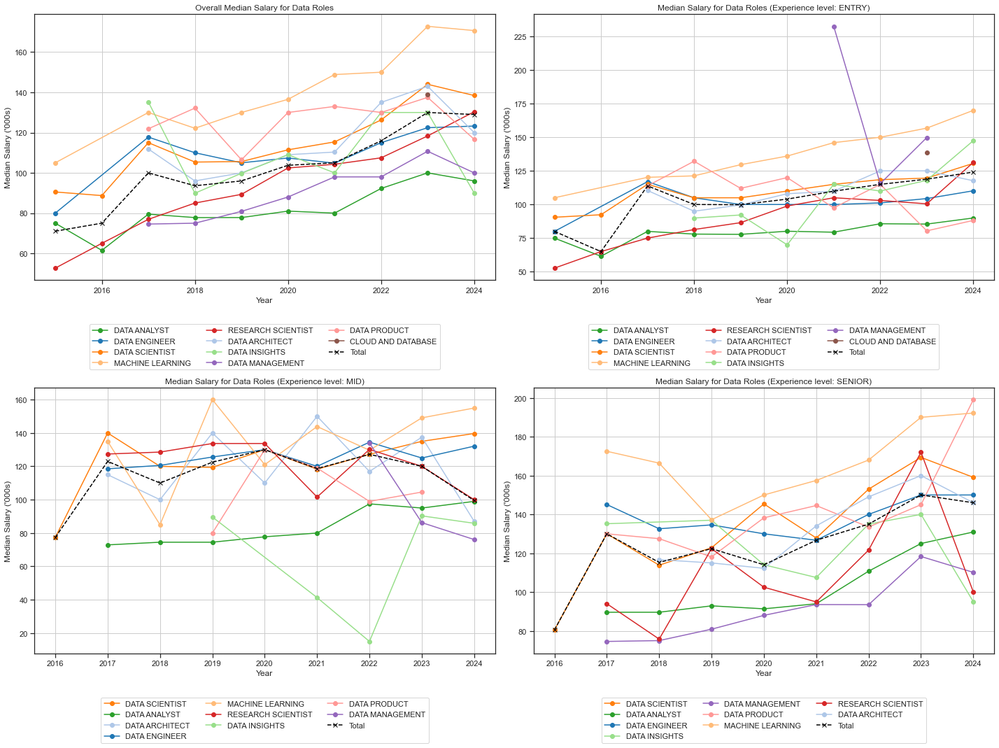

In [16]:
# Median salary for data roles and experience level across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
cmap = plt.get_cmap("tab20")
unique_roles = all_df["TYPE"].unique()
color_map = {role: cmap(i % cmap.N) for i, role in enumerate(unique_roles)}

# To see overall median salary
df_plt = all_df.groupby(["YEAR", "TYPE"])["y"].median().reset_index()
df_total = all_df.groupby("YEAR")["y"].median().reset_index()

for role in df_plt["TYPE"].unique():
    subset = df_plt[(df_plt["TYPE"] == role)] 
    axes[0, 0].plot(subset["YEAR"], subset['y'], marker='o', label=role, color=color_map[role])

axes[0, 0].plot(df_total["YEAR"], df_total["y"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("Overall Median Salary for Data Roles")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Median Salary ('000s)")
axes[0, 0].legend(title="Role")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by experience level
df_plt = all_df.groupby(["YEAR", "TYPE", "EXP"])["y"].median().reset_index()
exp_levels = ["ENTRY", "MID", "SENIOR"]
for i, exp in enumerate(exp_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_exp = df_plt[df_plt["EXP"] == exp]
    df_exp_total = df_plt[df_plt["EXP"] == exp].groupby("YEAR")["y"].median().reset_index()
    
    for role in df_exp["TYPE"].unique():
        subset = df_exp[df_exp["TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["y"], marker='o', label=role, color=color_map[role])
    
    axes[row, col].plot(df_exp_total["YEAR"], df_exp_total["y"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"Median Salary for Data Roles (Experience level: {exp})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Median Salary ('000s)")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)
    
plt.tight_layout()
plt.show()

Generally, median salaries have increased across time. This trend is most prominent for machine learning roles, which also has the highest median salaries across most years. Interestingly, in 2024, median salaries saw a drop for all data roles except research scientists.

Further segregation by experience levels shows that the increasing trend is most observable for entry and senior level roles. At higher experience levels, median salaries tend to fluctuate greater across time, but machine learning roles generally tend to hold the highest median salaries at every experience level.

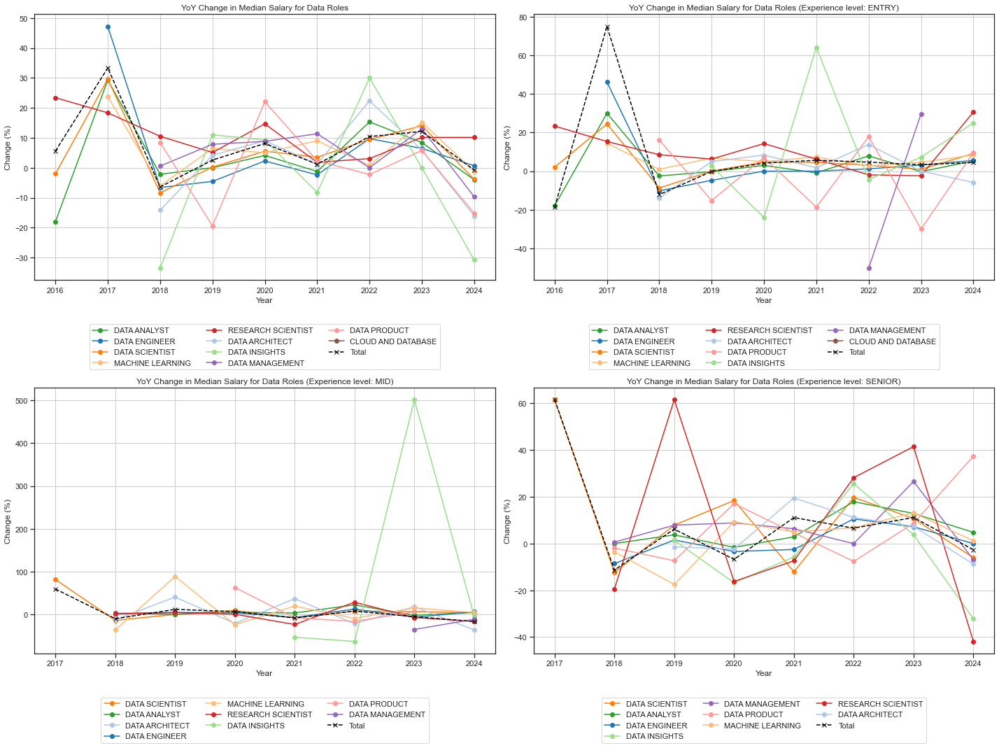

In [17]:
# YoY change in median salary for data roles and experience level across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# To see overall YoY change in median salary
df_plt = all_df.groupby(["YEAR", "TYPE"])["y"].median().reset_index()
df_plt["YoY CHANGE"] = df_plt.groupby(["TYPE"])["y"].pct_change()*100
df_total = all_df.groupby("YEAR")["y"].median().reset_index()
df_total["YoY CHANGE"] = df_total["y"].pct_change() * 100

for role in df_plt["TYPE"].unique():
    subset = df_plt[(df_plt["TYPE"] == role)]
    axes[0, 0].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=role, color=color_map[role])

axes[0, 0].plot(df_total["YEAR"], df_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("YoY Change in Median Salary for Data Roles")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Change (%)")
axes[0, 0].legend(title="Role")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by experience level
df_plt = all_df.groupby(["YEAR", "TYPE", "EXP"])["y"].median().reset_index()
df_plt["YoY CHANGE"] = df_plt.groupby(["TYPE", "EXP"])["y"].pct_change()*100
exp_levels = ["ENTRY", "MID", "SENIOR"]
for i, exp in enumerate(exp_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_exp = df_plt[df_plt["EXP"] == exp]
    df_exp_total = df_plt[df_plt["EXP"] == exp].groupby("YEAR")["y"].median().reset_index()
    df_exp_total["YoY CHANGE"] = df_exp_total["y"].pct_change() * 100
    
    for role in df_exp["TYPE"].unique():
        subset = df_exp[df_exp["TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=role, color=color_map[role])

    axes[row, col].plot(df_exp_total["YEAR"], df_exp_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"YoY Change in Median Salary for Data Roles (Experience level: {exp})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Change (%)")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()

YoY change in median salaries fluctuate across time for most data roles, with data insight and data product roles seeing the largest fluctation. 
This year, research scientists saw the highest growth in median salaries of 10%.

Further segregation by experience levels shows that the trend fluctuations are greater for entry and senior level roles. At entry level, growth in salaries look minimal, except for data insights roles where growth of median salaries saw a large increase in 2021 and 2023 for entry and mid level roles respectively. While research scientists saw the highest growth in 2024, this seems to be largely driven by entry level roles, as senior research scientists actually saw the largest negative growth.

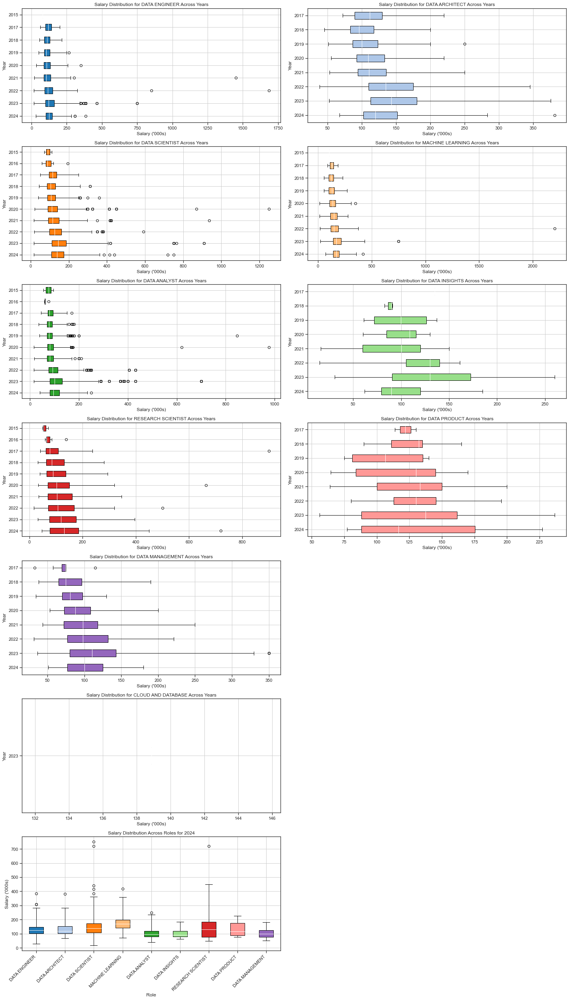

In [18]:
# Box plot of salary across time
df_plt = all_df.dropna(subset=["YEAR"]).reset_index()
num_roles = len(unique_roles)
num_rows = (num_roles // 2) + (num_roles % 2)
fig, axes = plt.subplots(num_rows + 1, 2, figsize=(20, 5*(num_rows + 1)))

# Box plots for each data role
for i, role in enumerate(unique_roles):
    row = i // 2
    col = i % 2
    df_role = df_plt[df_plt["TYPE"] == role]
    data = []
    labels = []
    for year in sorted(df_role["YEAR"].unique(), reverse=True):
        subset = df_role[df_role["YEAR"] == year]
        data.append(subset["y"])
        labels.append(year)
    if len(data) > 0:
        box = axes[row, col].boxplot(data, labels=labels, patch_artist=True, medianprops=dict(color='white'), whis=3, vert=False)
        for patch in box['boxes']:
            patch.set_facecolor(color_map[role])
        axes[row, col].set_title(f"Salary Distribution for {role} Across Years")
        axes[row, col].set_xlabel("Salary ('000s)")
        axes[row, col].set_ylabel("Year")
        axes[row, col].grid(True)

# Box plot for each data role in 2024
row = num_rows
col = 0
data = []
labels = []

for role in unique_roles:
    subset = df_plt[(df_plt["TYPE"] == role) & (df_plt["YEAR"] == 2024)]
    if not subset.empty:
        data.append(subset["y"])
        labels.append(role)

if len(data) > 0:     
    box = axes[row, col].boxplot(data, labels=labels, patch_artist=True, medianprops=dict(color='white'), whis=3, vert=True)
    for patch, role in zip(box['boxes'], labels):
        patch.set_facecolor(color_map[role])
    axes[row, col].set_title("Salary Distribution Across Roles for 2024")
    axes[row, col].set_xlabel("Role")
    axes[row, col].set_ylabel("Salary ('000s)")
    axes[row, col].grid(True)
    plt.setp(axes[row, col].get_xticklabels(), rotation=45, ha="right")

# Remove empty plots
for ax in axes.flatten():
    if not ax.has_data():
        ax.axis('off')
    
plt.tight_layout()
plt.show()

Across all roles, distribution of salaries have widened over time. For data analyst, data scientist, machine learning and research scientist roles in particular, salaries have skewed increasingly positive over the years. Additionally, salaries for data scientist and data analyst roles have the largest number of outliers, possibly also due to exceptionally large demand for such roles compared to other roles.

For data engineer roles, salaries have shown a consistent range with median salaries increasing slightly over time.  
For data architect roles, median salaries have generally increased, particularly in 2023, before falling in 2024.  
For data scientist roles, salaries have a broad distribution with numerous outliers, indicating high variability in pay.  
For machine learning roles, median salaries have been consistently higher than most other roles, and have been increasing over the years. The distribution of salaries are generally tight.  
For data analyst roles, salaries have increased steadily, with a wide distribution and many outliers.   
For data insight roles, salaries have increased steadily, with its distribution widening over time.  
For research scientist roles, salaries have increased over the year, with a positive skew in recent years.  
For data product and data management roles, median salaries have fluctuated over time, with a widening distribution.  

This year, the distribution of salaries for data scientist roles is the widest, and also has the largest positive skew. 

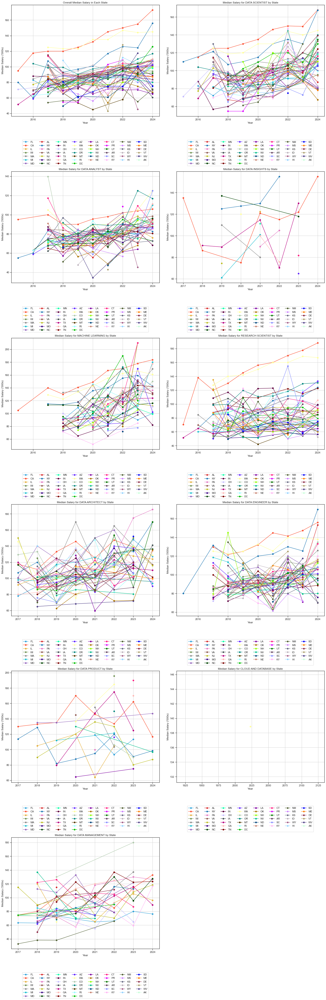

In [17]:
# Median salary for data roles and state across time 
df_plt = all_df.dropna(subset=["YEAR", "EMPLOYEE STATE"]).reset_index()
unique_roles = df_plt["TYPE"].unique()
unique_states = df_plt["EMPLOYEE STATE"].unique()
cmap = plt.get_cmap("cet_glasbey_hv")
color_map = {state: cmap(i % cmap.N) for i, state in enumerate(unique_states)}
num_roles = len(unique_roles)
num_rows = (num_roles // 2) + (num_roles % 2)
fig, axes = plt.subplots(num_rows + 1, 2, figsize=(20, 10*(num_rows + 1)))

# To see overall median salary in each state
df_plt_overall = df_plt.groupby(["YEAR", "EMPLOYEE STATE"])["y"].median().reset_index()
for state in unique_states:
    subset = df_plt_overall[(df_plt_overall["EMPLOYEE STATE"] == state)]
    axes[0, 0].plot(subset["YEAR"], subset['y'], marker='o', label=state, color=color_map[state])

axes[0, 0].set_title("Overall Median Salary in Each State")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Median Salary ('000s)")
axes[0, 0].legend(title="State")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=8)

# To further segregate by role
for i, role in enumerate(unique_roles):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_plt_role = df_plt[df_plt["TYPE"] == role].groupby(["YEAR", "EMPLOYEE STATE"])["y"].median().reset_index()
    for state in unique_states:
        subset = df_plt_role[df_plt_role["EMPLOYEE STATE"] == state]
        axes[row, col].plot(subset["YEAR"], subset["y"], marker='o', label=state, color=color_map[state])

    axes[row, col].set_title(f"Median Salary for {role} by State")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Median Salary ('000s)")
    axes[row, col].legend(title="State")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=8)


# Remove empty plots
for ax in axes.flatten():
    if not ax.has_data():
        ax.axis('off')
    
plt.tight_layout()
plt.show()

Overall, median salary for data roles in CA, WA and NY have been on a consistently increasing trend, and consistently higher than other states. This year, median salaries are highest in CA, followed by NY and WA. Note that earlier, it wwas observed that median salaries decreased across almost all data roles in 2024. However, median salaries in these three states saw an increase in 2024.

Further segregation by data roles, we see:  
For data scientist roles, the top 3 states with the highest median salaries in 2024 are CA, NY and WA  
For data analyst roles, the top 3 states with the highest median salaries in 2024 are WA, OH and OR  
For data insight roles, data for 2024 is too scarce to make an inference regarding the top states in terms of salaries  
For machine learning roles, the top 3 states with the highest median salaries in 2024 are CA, MI and GA  
For research scientist roles, the top 3 states with the highest median salaries in 2024 are CA, NY and AZ  
For data architect roles, the top 3 states with the highest median salaries in 2024 are PA, NY and UT  
For data engineer roles, the top 3 states with the highest median salaries in 2024 are NY, CA and TX  
For data product roles, data for 2024 is scarce but the top state with highest median salary is MD  
For cloud and database roles, data for 2024 is too scarce to make an inference regarding the top states in terms of salaries  
For data management roles, the top 3 states with the highest median salaries in 2024 are CA, NC and PA  

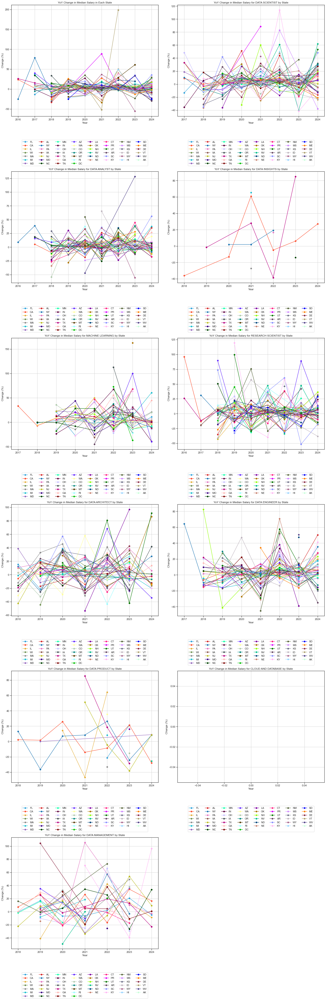

In [18]:
# YoY change in median salary for data roles and experience level across time 
df_plt = all_df.dropna(subset=["YEAR", "EMPLOYEE STATE"]).reset_index()
fig, axes = plt.subplots(num_rows + 1, 2, figsize=(20, 10*(num_rows + 1)))

# To see overall YoY change in median salary
df_plt_overall = df_plt.groupby(["YEAR", "EMPLOYEE STATE"])["y"].median().reset_index()
df_plt_overall["YoY CHANGE"] = df_plt_overall.groupby(["EMPLOYEE STATE"])["y"].pct_change()*100

for state in unique_states:
    subset = df_plt_overall[(df_plt_overall["EMPLOYEE STATE"] == state)]
    axes[0, 0].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=state, color=color_map[state])

axes[0, 0].set_title("YoY Change in Median Salary in Each State")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Change (%)")
axes[0, 0].legend(title="State")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=8)

# To further segregate by data roles
for i, role in enumerate(unique_roles):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_plt_role = df_plt[df_plt["TYPE"] == role].groupby(["YEAR", "EMPLOYEE STATE"])["y"].median().reset_index()
    df_plt_role["YoY CHANGE"] = df_plt_role.groupby("EMPLOYEE STATE")["y"].pct_change() * 100
    for state in unique_states:
        subset = df_plt_role[df_plt_role["EMPLOYEE STATE"] == state]
        axes[row, col].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=state, color=color_map[state])

    axes[row, col].set_title(f"YoY Change in Median Salary for {role} by State")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Change (%)")
    axes[row, col].legend(title="State")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=8)

# Remove empty plots
for ax in axes.flatten():
    if not ax.has_data():
        ax.axis('off')
        
plt.tight_layout()
plt.show()

YoY change in median salaries fluctuate across time for most states. This year, SC sees the highest growth in median salaries of about 40%.

Further segregation by data roles, we see:  
For data scientist roles, the top 3 states with the highest growth in median salaries in 2024 are NV, UT and SC  
For data analyst roles, the top 3 states with the highest growth in median salaries in 2024 are SC, MI and AL  
For data insight roles, data for 2024 is too scarce to make an inference regarding the top states in terms of salary growth  
For machine learning roles, the top 3 states with the highest growth in median salaries in 2024 are MI, GA and KS  
For research scientist roles, the top 3 states with the highest growth in median salaries in 2024 are MH, GA and NM  
For data architect roles, the top 3 states with the highest growth in median salaries in 2024 are UT, OK and IA  
For data engineer roles, the top 3 states with the highest growth in median salaries in 2024 are AL, KY and NY  
For data product roles, data for 2024 is scarce but the top state with highest growth in median salary is MD  
For cloud and database roles, data for 2024 is too scarce to make an inference regarding the top states in terms of salary growth  
For data management roles, the top 3 states with the highest growth in median salaries in 2024 are KY, UT and CA  


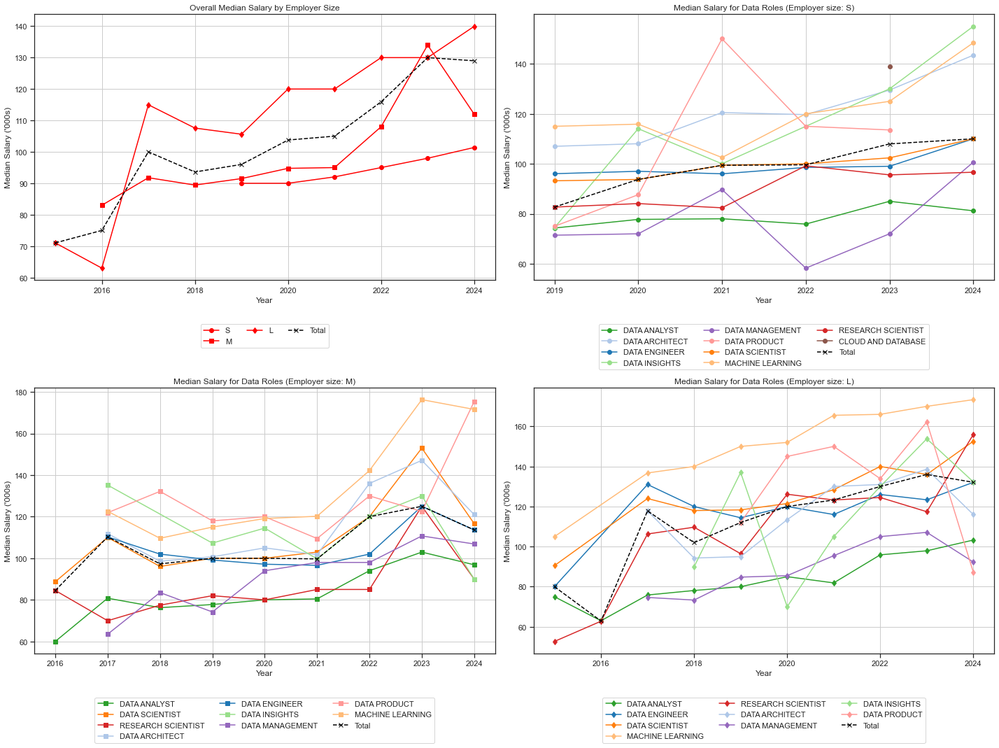

In [19]:
# Median salary for employer size across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
cmap = plt.get_cmap("tab20")
unique_roles = all_df["TYPE"].unique()
size_levels = ["S", "M", "L"]
color_map = {role: cmap(i % cmap.N) for i, role in enumerate(unique_roles)}
markers = ['o', 's', 'd']
size_marker_map = {size: marker for size, marker in zip(size_levels, markers)}

# To see overall median salary by employer size
df_plt = all_df.groupby(["YEAR", "EMPLOYER SIZE"])["y"].median().reset_index()
df_total = all_df.groupby("YEAR")["y"].median().reset_index()

for size in size_levels:
    subset = df_plt[df_plt["EMPLOYER SIZE"] == size]
    axes[0, 0].plot(subset["YEAR"], subset['y'], marker=size_marker_map[size], label=size, linestyle='-', color='red')

axes[0, 0].plot(df_total["YEAR"], df_total["y"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("Overall Median Salary by Employer Size")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Median Salary ('000s)")
axes[0, 0].legend(title="Size")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by data roles within each employer size
df_plt = all_df.groupby(["YEAR", "TYPE", "EMPLOYER SIZE"])["y"].median().reset_index()
for i, size in enumerate(size_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_size = df_plt[df_plt["EMPLOYER SIZE"] == size]
    df_size_total = df_plt[df_plt["EMPLOYER SIZE"] == size].groupby("YEAR")["y"].median().reset_index()

    for role in df_size["TYPE"].unique():
        subset = df_size[df_size["TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["y"], marker=size_marker_map[size], label=role, color=color_map[role])

    axes[row, col].plot(df_size_total["YEAR"], df_size_total["y"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"Median Salary for Data Roles (Employer size: {size})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Median Salary ('000s)")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()


As expected, large companies tend to offer the highest median salaries followed by medium and small firms. 

Further segregation by company size shows:  
For small companies, the top 3 roles with the highest growth in 2024 are data insights, machine learning and data architect roles  
For medium companies, the top 3 roles with the highest growth in 2024 are data product, machine learning and data architect roles  
For large companies, the top 3 roles with the highest growth in 2024 are machine learning, research scientist and data scientist roles  

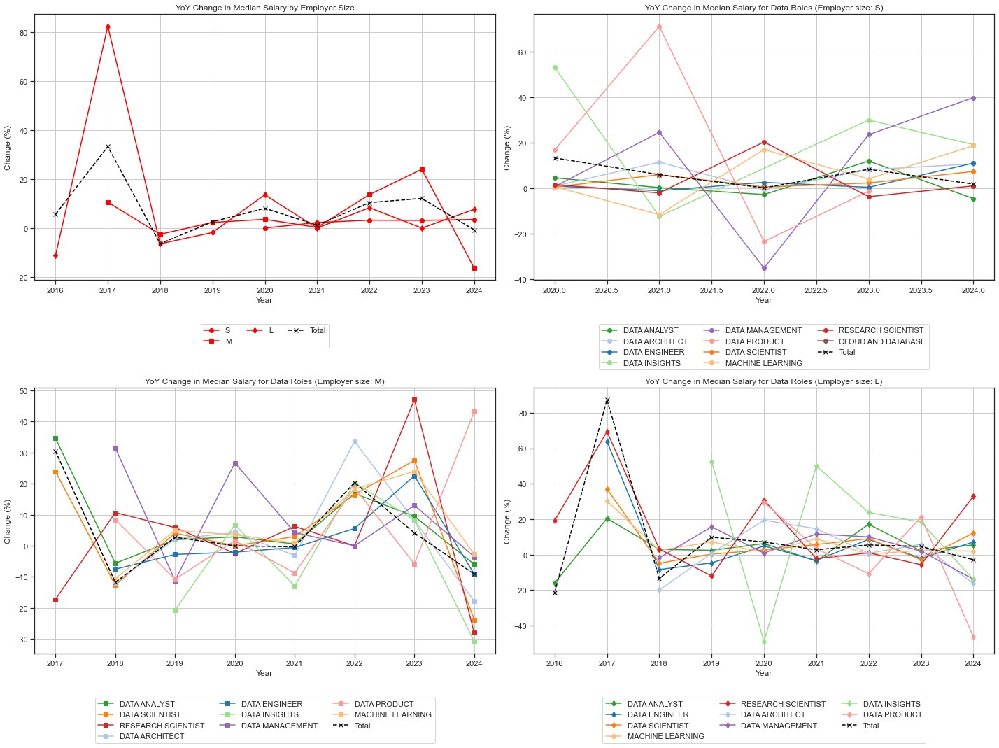

In [20]:
# YoY change in median salary for data roles and employer size across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
cmap = plt.get_cmap("tab20")
unique_roles = all_df["TYPE"].unique()
size_levels = ["S", "M", "L"]
color_map = {role: cmap(i % cmap.N) for i, role in enumerate(unique_roles)}
markers = ['o', 's', 'd']
size_marker_map = {size: marker for size, marker in zip(size_levels, markers)}

# To see overall YoY change in median salary
df_plt = all_df.groupby(["YEAR", "EMPLOYER SIZE"])["y"].median().reset_index()
df_plt["YoY CHANGE"] = df_plt.groupby(["EMPLOYER SIZE"])["y"].pct_change() * 100
df_total = all_df.groupby("YEAR")["y"].median().reset_index()
df_total["YoY CHANGE"] = df_total["y"].pct_change() * 100

for size in size_levels:
    subset = df_plt[df_plt["EMPLOYER SIZE"] == size]
    axes[0, 0].plot(subset["YEAR"], subset["YoY CHANGE"], marker=size_marker_map[size], label=size, linestyle='-', color='red')

axes[0, 0].plot(df_total["YEAR"], df_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("YoY Change in Median Salary by Employer Size")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Change (%)")
axes[0, 0].legend(title="Size")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by data roles within each employer size
df_plt = all_df.groupby(["YEAR", "TYPE", "EMPLOYER SIZE"])["y"].median().reset_index()
df_plt["YoY CHANGE"] = df_plt.groupby(["TYPE", "EMPLOYER SIZE"])["y"].pct_change() * 100
for i, size in enumerate(size_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_size = df_plt[df_plt["EMPLOYER SIZE"] == size]
    df_size_total = df_size.groupby("YEAR")["y"].median().reset_index()
    df_size_total["YoY CHANGE"] = df_size_total["y"].pct_change() * 100

    for role in df_size["TYPE"].unique():
        subset = df_size[df_size["TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["YoY CHANGE"], marker=size_marker_map[size], label=role, color=color_map[role])

    axes[row, col].plot(df_size_total["YEAR"], df_size_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"YoY Change in Median Salary for Data Roles (Employer size: {size})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Change (%)")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()


Yoy change in median salaries across all roles generally follow the same trend, regardless of size. However, in 2024, median salaries in medium firms saw a negative growth.

Further segregation by company size shows:  
For small companies, the 3 highest paid roles in 2024 are data insights, machine learning and data architect roles  
For medium companies, the 3 highest paid roles in 2024 are data product, machine learning and data architect roles  
For large companies, the 3 highest paid roles in 2024 are machine learning, research scientist and data scientist roles  

In [19]:
full_all_df

,YEAR,EMPLOYER,JOB TITLE,TYPE,COMPANY LOCATION,COMPANY STATE,EMPLOYEE LOCATION,EMPLOYEE STATE,EMPLOYER SIZE,y,EXP,EMPLOYMENT TYPE,WORK SETTING,REMOTE RATIO,WORK MODELS
0,2023,UNKNOWN,DATA DEVOPS ENGINEER,DATA ENGINEER,GERMANY,UNKNOWN,GERMANY,UNKNOWN,L,95.01,MID,FT,HYBRID,NaN,NaN
1,2023,UNKNOWN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,UNKNOWN,UNITED STATES,UNKNOWN,M,186.00,SENIOR,FT,IN-PERSON,NaN,NaN
2,2023,UNKNOWN,DATA ARCHITECT,DATA ARCHITECT,UNITED STATES,UNKNOWN,UNITED STATES,UNKNOWN,M,81.80,SENIOR,FT,IN-PERSON,NaN,NaN
3,2023,UNKNOWN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,UNKNOWN,UNITED STATES,UNKNOWN,M,212.00,SENIOR,FT,IN-PERSON,NaN,NaN
4,2023,UNKNOWN,DATA SCIENTIST,DATA SCIENTIST,UNITED STATES,UNKNOWN,UNITED STATES,UNKNOWN,M,93.30,SENIOR,FT,IN-PERSON,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101667,2018,LDISCOVERY LLC,DATA MANAGEMENT TEAM LEAD,DATA MANAGEMENT,UNITED STATES,VA,UNITED STATES,VA,M,104.40,SENIOR,NaN,NaN,NaN,NaN
101668,2021,CITADEL ENTERPRISE AMERICAS LLC,DATA MANAGEMENT TECHNICAL ANALYST,DATA MANAGEMENT,UNITED STATES,IL,UNITED STATES,NY,M,110.00,SENIOR,NaN,NaN,NaN,NaN
101669,2023,CITADEL ENTERPRISE AMERICAS SERVICES LLC,DATA MANAGEMENT TECHNICAL ANALYST,DATA MANAGEMENT,UNITED STATES,FL,UNITED STATES,NY,M,135.00,SENIOR,NaN,NaN,NaN,NaN
101670,2019,HITACHI VANTARA CORPORATION,DATA MANAGEMENT TECHNICAL LEAD,DATA MANAGEMENT,UNITED STATES,CA,UNITED STATES,CA,S,101.38,SENIOR,NaN,NaN,NaN,NaN


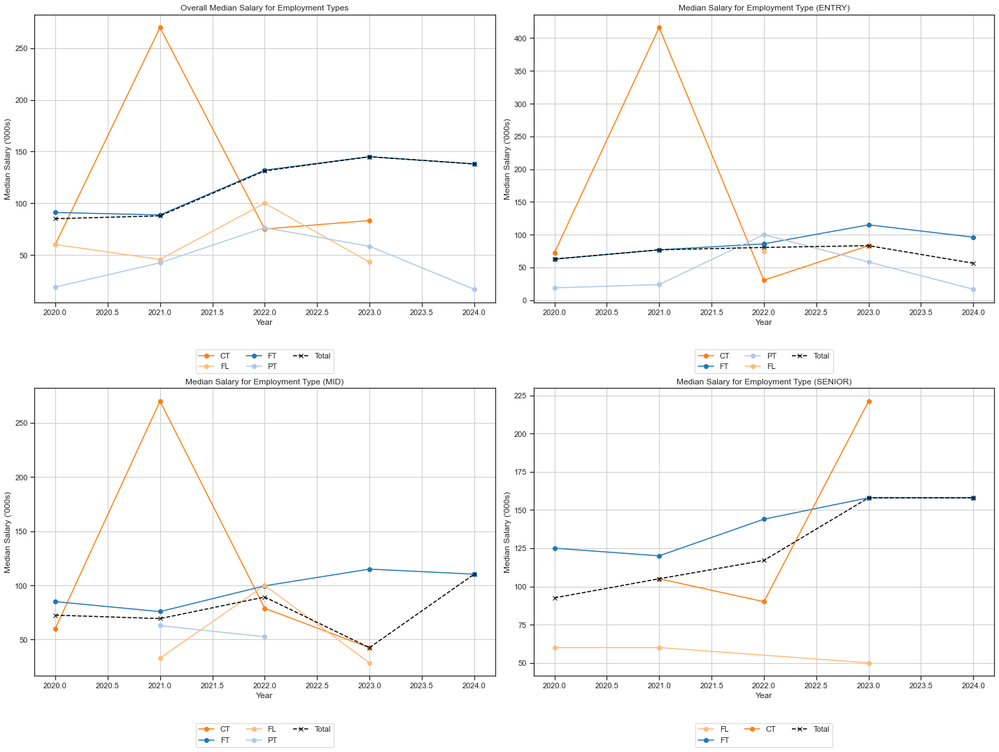

In [28]:
# Median salary for data roles and experience level across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

full_all_df_plt = full_all_df.dropna(subset=["EMPLOYMENT TYPE"])

cmap = plt.get_cmap("tab20")
unique_roles = full_all_df_plt["EMPLOYMENT TYPE"].unique()
color_map = {role: cmap(i % cmap.N) for i, role in enumerate(unique_roles)}

# To see overall median salary
df_plt = full_all_df_plt.groupby(["YEAR", "EMPLOYMENT TYPE"])["y"].median().reset_index()
df_total = full_all_df_plt.groupby("YEAR")["y"].median().reset_index()

for role in df_plt["EMPLOYMENT TYPE"].unique():
    subset = df_plt[(df_plt["EMPLOYMENT TYPE"] == role)] 
    axes[0, 0].plot(subset["YEAR"], subset['y'], marker='o', label=role, color=color_map[role])

axes[0, 0].plot(df_total["YEAR"], df_total["y"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("Overall Median Salary for Employment Types")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Median Salary ('000s)")
axes[0, 0].legend(title="Role")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by experience level
df_plt = full_all_df_plt.groupby(["YEAR", "EMPLOYMENT TYPE", "EXP"])["y"].median().reset_index()
exp_levels = ["ENTRY", "MID", "SENIOR"]
for i, exp in enumerate(exp_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_exp = df_plt[df_plt["EXP"] == exp]
    df_exp_total = df_plt[df_plt["EXP"] == exp].groupby("YEAR")["y"].median().reset_index()
    
    for role in df_exp["EMPLOYMENT TYPE"].unique():
        subset = df_exp[df_exp["EMPLOYMENT TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["y"], marker='o', label=role, color=color_map[role])
    
    axes[row, col].plot(df_exp_total["YEAR"], df_exp_total["y"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"Median Salary for Employment Types (Experience level: {exp})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Median Salary ('000s)")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)
    
plt.tight_layout()
plt.show()

Full-time roles have generally increased throughout the years before dipping slightly in 2024. Consultant roles increased significantly from 2020 to 2021 before dipping harshly again in 2022.

Entry and mid roles seem to have wages mirror the overall trend. However for senior roles, there is actually an overall increase in wage of consultants and full-time employees.

In [44]:
unique_roles

array(['DATA ENGINEER', 'DATA ARCHITECT', 'DATA SCIENTIST',
       'MACHINE LEARNING', 'DATA ANALYST', 'DATA INSIGHTS',
       'RESEARCH SCIENTIST', 'DATA PRODUCT', 'DATA MANAGEMENT'],
      dtype=object)

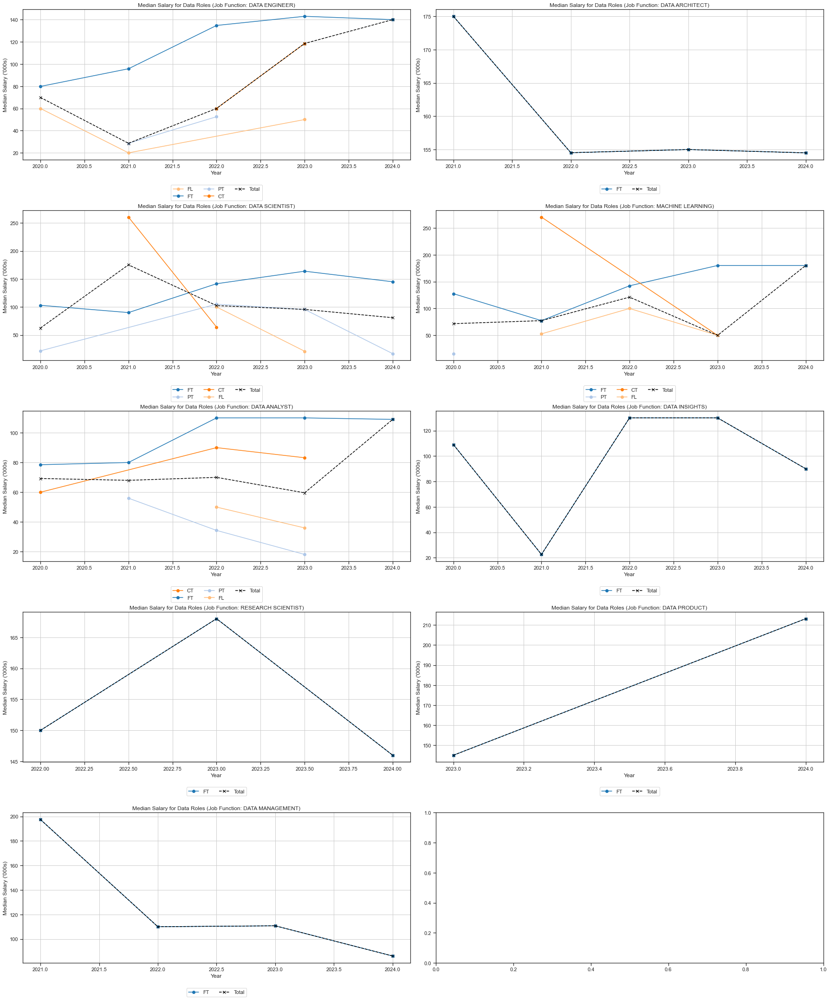

In [54]:
# Median salary for data roles and experience level across time 
fig, axes = plt.subplots(5, 2, figsize=(25, 30))

full_all_df_plt = full_all_df.dropna(subset=["EMPLOYMENT TYPE"])
unique_employment_types = full_all_df_plt["EMPLOYMENT TYPE"].unique()
cmap = plt.get_cmap("tab20")
color_map = {role: cmap(i % cmap.N) for i, role in enumerate(unique_employment_types)}

# To further segregate by experience level
df_plt = full_all_df_plt.groupby(["YEAR", "TYPE", "EMPLOYMENT TYPE"])["y"].median().reset_index()
unique_roles = full_all_df_plt["TYPE"].unique()
for i, role in enumerate(unique_roles):
    row = i // 2
    col = i % 2
    df_type = df_plt[df_plt["TYPE"] == role]
    df_type_total = df_plt[df_plt["TYPE"] == role].groupby("YEAR")["y"].median().reset_index()
    
    for employment_type in df_type["EMPLOYMENT TYPE"].unique():
        subset = df_type[df_type["EMPLOYMENT TYPE"] == employment_type]
        axes[row, col].plot(subset["YEAR"], subset["y"], marker='o', label=employment_type, color=color_map[employment_type])
    
    axes[row, col].plot(df_type_total["YEAR"], df_type_total["y"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"Median Salary for Data Roles (Job Function: {role})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Median Salary ('000s)")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)
    
plt.tight_layout()
plt.show()

Full time roles are generally more prominent across all job types, full-timers generally get paid a higher wage as well. For data scientist and machine learning roles, consultants were paid higher in 2021, before falling back down to below full-time roles in 2022.

## 4b. Analysing job demand

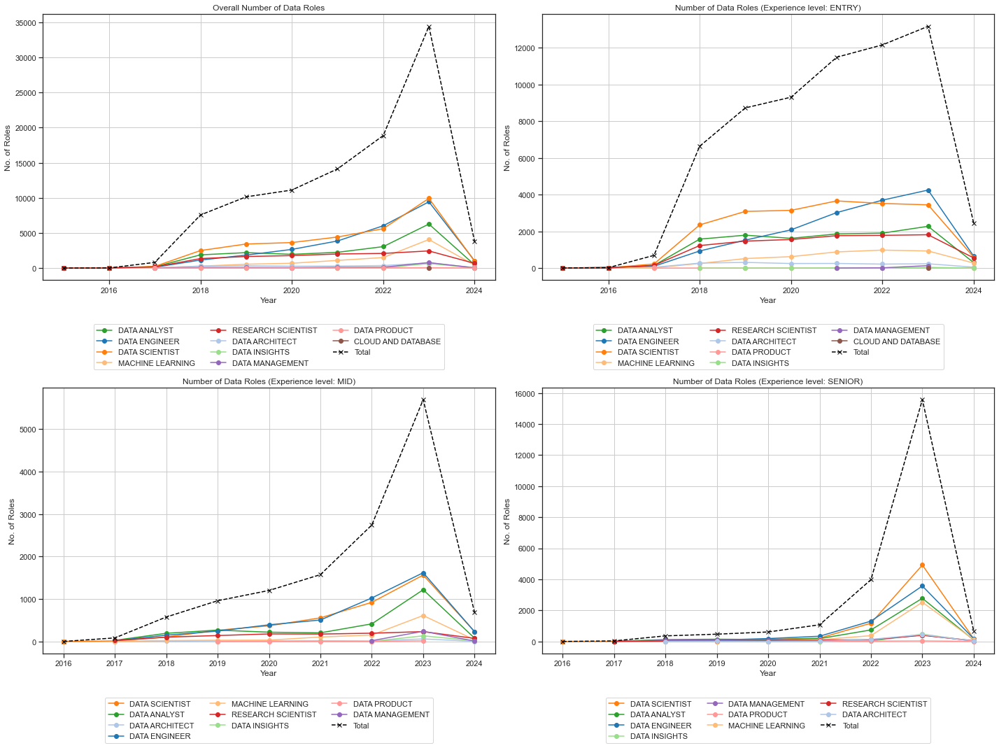

In [26]:
# Number of data roles and experience level across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
cmap = plt.get_cmap("tab20")
unique_roles = all_df["TYPE"].unique()
color_map = {role: cmap(i % cmap.N) for i, role in enumerate(unique_roles)}

# To see overall number of data roles
df_plt = all_df.groupby(["YEAR", "TYPE"]).size().reset_index(name="count")
df_total = df_plt.groupby("YEAR")["count"].sum().reset_index()

for role in df_plt["TYPE"].unique():
    subset = df_plt[(df_plt["TYPE"] == role)]
    axes[0, 0].plot(subset["YEAR"], subset["count"], marker='o', label=role, color=color_map[role])

axes[0, 0].plot(df_total["YEAR"], df_total["count"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("Overall Number of Data Roles")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("No. of Roles")
axes[0, 0].legend(title="Role")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by experience level
df_plt = all_df.groupby(["YEAR", "TYPE", "EXP"]).size().reset_index(name="count")
exp_levels = ["ENTRY", "MID", "SENIOR"]
for i, exp in enumerate(exp_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_exp = df_plt[df_plt["EXP"] == exp]
    df_exp_total = df_exp.groupby("YEAR")["count"].sum().reset_index()
    
    for role in df_exp["TYPE"].unique():
        subset = df_exp[df_exp["TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["count"], marker='o', label=role, color=color_map[role])

    axes[row, col].plot(df_exp_total["YEAR"], df_exp_total["count"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"Number of Data Roles (Experience level: {exp})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("No. of Roles")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()

Generally, number of data roles have increased across time before 2024, followed by a sharp drop in 2024. This trend is especially observable for data scientist, data engineer and data analyst roles. These observations are similar across all experience levels. However, we should note that the data for 2024 is incomplete, and may attribute to the seeming decline in data roles.

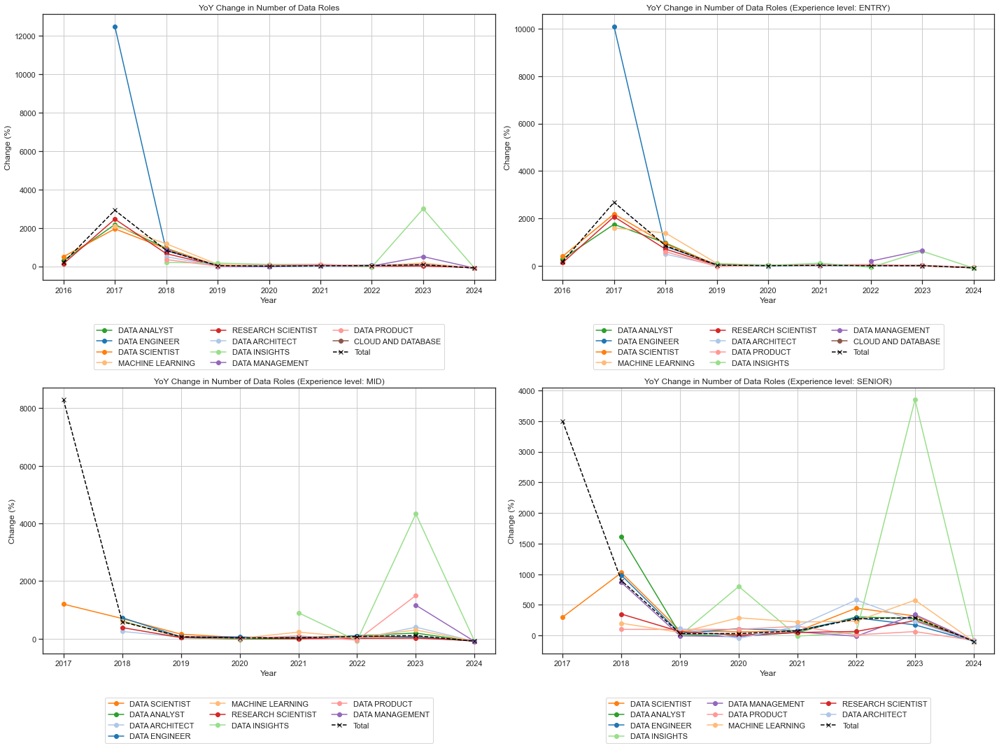

In [22]:
# YoY change in number of data roles for data roles and experience level across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# To see overall YoY change in number of data roles
df_plt = all_df.groupby(["YEAR", "TYPE"])["y"].size().reset_index(name="count")
df_plt["YoY CHANGE"] = df_plt.groupby(["TYPE"])["count"].pct_change()*100
df_total = df_plt.groupby("YEAR")["count"].sum().reset_index()
df_total["YoY CHANGE"] = df_total["count"].pct_change() * 100

for role in df_plt["TYPE"].unique():
    subset = df_plt[(df_plt["TYPE"] == role)]
    axes[0, 0].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=role, color=color_map[role])

axes[0, 0].plot(df_total["YEAR"], df_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("YoY Change in Number of Data Roles")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Change (%)")
axes[0, 0].legend(title="Role")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by experience level
df_plt = all_df.groupby(["YEAR", "TYPE", "EXP"])["y"].size().reset_index(name="count")
df_plt["YoY CHANGE"] = df_plt.groupby(["TYPE", "EXP"])["count"].pct_change()*100
exp_levels = ["ENTRY", "MID", "SENIOR"]
for i, exp in enumerate(exp_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_exp = df_plt[df_plt["EXP"] == exp]
    df_exp_total = df_exp.groupby("YEAR")["count"].sum().reset_index()
    df_exp_total["YoY CHANGE"] = df_exp_total["count"].pct_change() * 100
    
    for role in df_exp["TYPE"].unique():
        subset = df_exp[df_exp["TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=role, color=color_map[role])

    axes[row, col].plot(df_exp_total["YEAR"], df_exp_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"YoY Change in Number of Data Roles (Experience level: {exp})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Change (%)")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()

We first see that there is extreme decrease in growth of demand for data engineer roles from 2017 to 2018, and also a sharp increase in growth of demand for data insight roles in 2023, followed by a sharp drop in 2024. This trend is consistent across all experience levels.

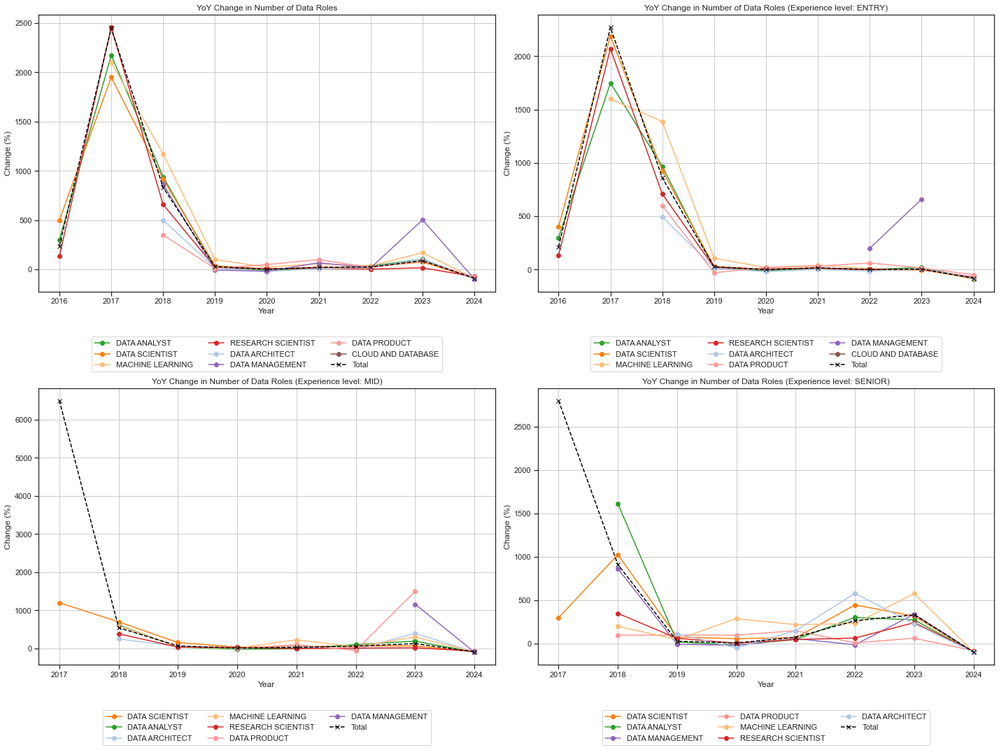

In [23]:
# Further filter out data engineer and data insight roles
exclude = ["DATA ENGINEER", "DATA INSIGHTS"]
filtered_df = all_df[~all_df["TYPE"].isin(exclude)]

# YoY change in number of data roles for data roles and experience level across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# To see overall YoY change in number of data roles
df_plt = filtered_df.groupby(["YEAR", "TYPE"]).size().reset_index(name="count")
df_plt["YoY CHANGE"] = df_plt.groupby(["TYPE"])["count"].pct_change() * 100
df_total = df_plt.groupby("YEAR")["count"].sum().reset_index()
df_total["YoY CHANGE"] = df_total["count"].pct_change() * 100

for role in df_plt["TYPE"].unique():
    subset = df_plt[df_plt["TYPE"] == role]
    axes[0, 0].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=role, color=color_map[role])

axes[0, 0].plot(df_total["YEAR"], df_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("YoY Change in Number of Data Roles")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Change (%)")
axes[0, 0].legend(title="Role")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by experience level
df_plt = filtered_df.groupby(["YEAR", "TYPE", "EXP"]).size().reset_index(name="count")
df_plt["YoY CHANGE"] = df_plt.groupby(["TYPE", "EXP"])["count"].pct_change() * 100
exp_levels = ["ENTRY", "MID", "SENIOR"]
for i, exp in enumerate(exp_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_exp = df_plt[df_plt["EXP"] == exp]
    df_exp_total = df_exp.groupby("YEAR")["count"].sum().reset_index()
    df_exp_total["YoY CHANGE"] = df_exp_total["count"].pct_change() * 100

    for role in df_exp["TYPE"].unique():
        subset = df_exp[df_exp["TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=role, color=color_map[role])

    axes[row, col].plot(df_exp_total["YEAR"], df_exp_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"YoY Change in Number of Data Roles (Experience level: {exp})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Change (%)")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()



To further investigate trends, we left out extreme data values due to data engineering and data insights roles. We see that there has a surge in growth of demand for data roles in 2018, and this growth has generally declined over the years, except for a sudden peak in 2023. In 2023, the growth in demand for data management roles was the highest out of all roles. There has been a negative growth in demand for data roles in 2024.

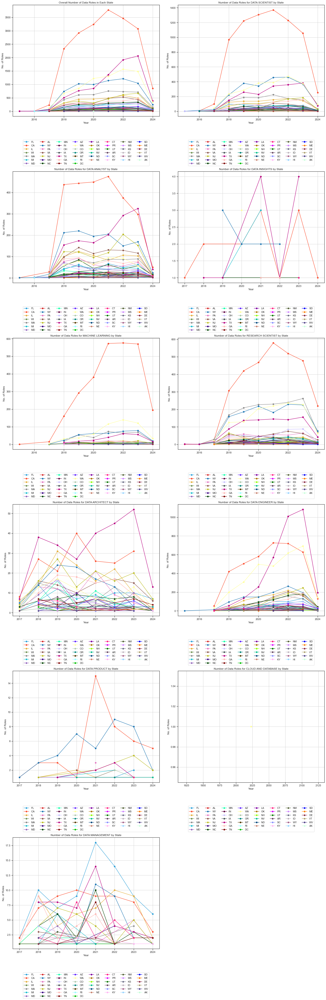

In [24]:
# Number of data roles and state across time 
df_plt = all_df.dropna(subset=["YEAR", "EMPLOYEE STATE"]).reset_index()
unique_roles = df_plt["TYPE"].unique()
unique_states = df_plt["EMPLOYEE STATE"].unique()
cmap = plt.get_cmap("cet_glasbey_hv")
color_map = {state: cmap(i % cmap.N) for i, state in enumerate(unique_states)}
num_roles = len(unique_roles)
num_rows = (num_roles // 2) + (num_roles % 2)
fig, axes = plt.subplots(num_rows + 1, 2, figsize=(20, 10*(num_rows + 1)))

# To see overall number of data roles in each state
df_plt_overall = df_plt.groupby(["YEAR", "EMPLOYEE STATE"]).size().reset_index(name="count")
for state in unique_states:
    subset = df_plt_overall[(df_plt_overall["EMPLOYEE STATE"] == state)]
    axes[0, 0].plot(subset["YEAR"], subset['count'], marker='o', label=state, color=color_map[state])

axes[0, 0].set_title("Overall Number of Data Roles in Each State")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("No. of Roles")
axes[0, 0].legend(title="State")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=8)

# To further segregate by role
for i, role in enumerate(unique_roles):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_plt_role = df_plt[df_plt["TYPE"] == role].groupby(["YEAR", "EMPLOYEE STATE"]).size().reset_index(name="count")
    for state in unique_states:
        subset = df_plt_role[df_plt_role["EMPLOYEE STATE"] == state]
        axes[row, col].plot(subset["YEAR"], subset["count"], marker='o', label=state, color=color_map[state])

    axes[row, col].set_title(f"Number of Data Roles for {role} by State")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("No. of Roles")
    axes[row, col].legend(title="State")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=8)


# Remove empty plots
for ax in axes.flatten():
    if not ax.has_data():
        ax.axis('off')

plt.tight_layout()
plt.show()


Overall, number of data roles have been on the decline since 2021, and a further sharp decline in 2024. This trend is exceptionally observable in CA

Further segregation by data roles, we see:  
For data scientist roles, the 3 states with the largest number of data roles in 2024 are CA, WA and NY  
For data analyst roles, the top 3 states with the largest number of data roles in 2024 are CA, TX and NY  
For data insight roles, data for 2024 is too scarce to make an inference regarding the top states in terms of largest number of data roles  
For machine learning roles, the top 3 states with the largest number of data roles in 2024 are CA, WA and NY  
For research scientist roles, the top 3 states with the largest number of data roles in 2024 are CA, NY and MA  
For data architect roles, the top 3 states with the largest number of data roles in 2024 are TX, NJ and NY  
For data engineer roles, the top 3 states with the largest number of data roles in 2024 are TX, WA and CA  
For data product roles, data for 2024 is scarce but the top state with largest number of data roles is CA  
For cloud and database roles, data for 2024 is too scarce to make an inference regarding the top states in terms of largest number of data roles  
For data management roles, the top 3 states with the largest number of data roles in 2024 are FL, CA and IL  

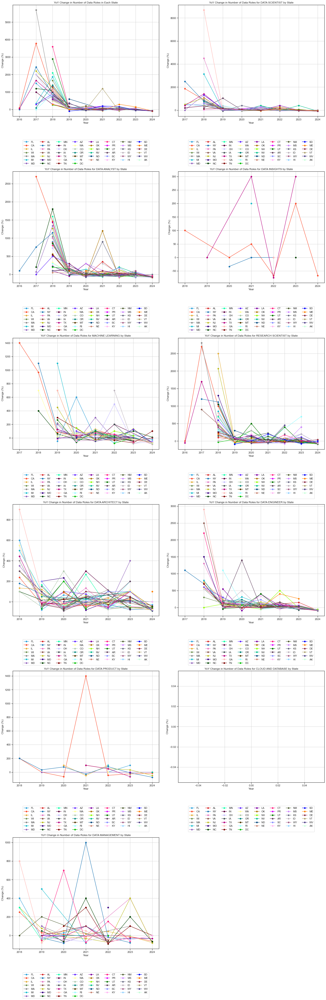

In [25]:
# YoY change in number of data roles for data roles and experience level across time 
df_plt = all_df.dropna(subset=["YEAR", "EMPLOYEE STATE"]).reset_index()
fig, axes = plt.subplots(num_rows + 1, 2, figsize=(20, 10*(num_rows + 1)))

# To see overall YoY change in number of data roles in each state
df_plt_overall = df_plt.groupby(["YEAR", "EMPLOYEE STATE"]).size().reset_index(name="count")
df_plt_overall["YoY CHANGE"] = df_plt_overall.groupby(["EMPLOYEE STATE"])["count"].pct_change() * 100

for state in unique_states:
    subset = df_plt_overall[(df_plt_overall["EMPLOYEE STATE"] == state)]
    axes[0, 0].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=state, color=color_map[state])

axes[0, 0].set_title("YoY Change in Number of Data Roles in Each State")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Change (%)")
axes[0, 0].legend(title="State")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=8)

# To further segregate by data roles
for i, role in enumerate(unique_roles):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_plt_role = df_plt[df_plt["TYPE"] == role].groupby(["YEAR", "EMPLOYEE STATE"]).size().reset_index(name="count")
    df_plt_role["YoY CHANGE"] = df_plt_role.groupby("EMPLOYEE STATE")["count"].pct_change() * 100
    for state in unique_states:
        subset = df_plt_role[df_plt_role["EMPLOYEE STATE"] == state]
        axes[row, col].plot(subset["YEAR"], subset["YoY CHANGE"], marker='o', label=state, color=color_map[state])

    axes[row, col].set_title(f"YoY Change in Number of Data Roles for {role} by State")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Change (%)")
    axes[row, col].legend(title="State")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=8)

# Remove empty plots
for ax in axes.flatten():
    if not ax.has_data():
        ax.axis('off')

plt.tight_layout()
plt.show()

YoY change in number of job roles fluctuate across time for all states. We see the emergence of data roles in most states in 2017 and 2018.

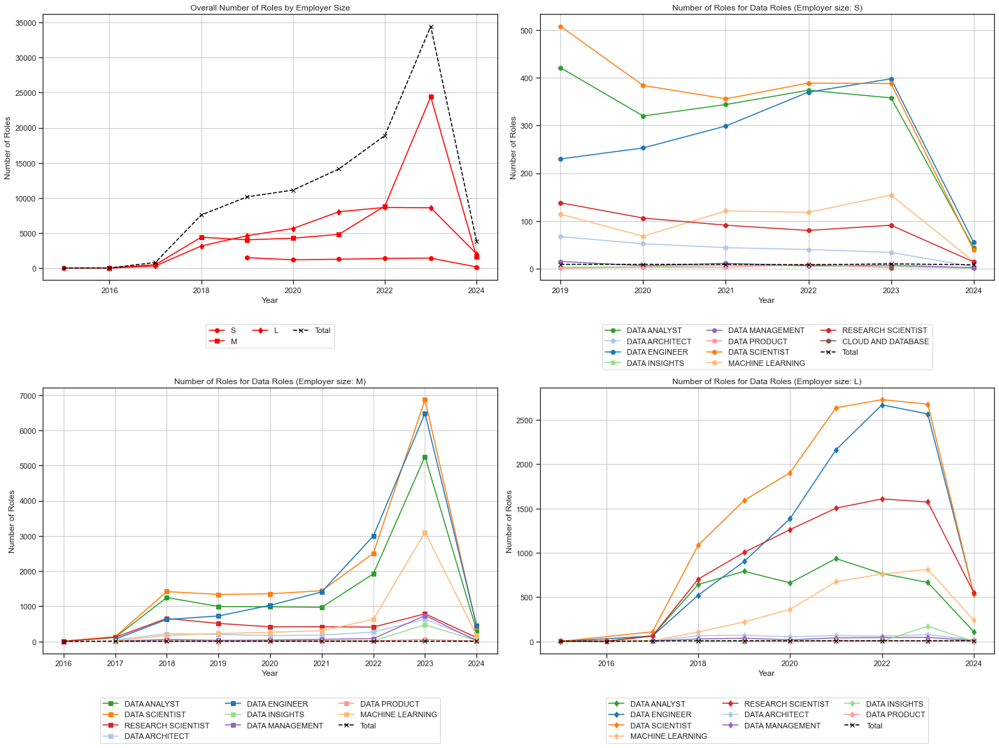

In [26]:
# Number of roles for employer size across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
cmap = plt.get_cmap("tab20")
unique_roles = all_df["TYPE"].unique()
size_levels = ["S", "M", "L"]
color_map = {role: cmap(i % cmap.N) for i, role in enumerate(unique_roles)}
markers = ['o', 's', 'd']
size_marker_map = {size: marker for size, marker in zip(size_levels, markers)}

# To see overall number of roles by employer size
df_plt = all_df.groupby(["YEAR", "EMPLOYER SIZE"]).size().reset_index(name="count")
df_total = all_df.groupby("YEAR").size().reset_index(name="count")

for size in size_levels:
    subset = df_plt[df_plt["EMPLOYER SIZE"] == size]
    axes[0, 0].plot(subset["YEAR"], subset["count"], marker=size_marker_map[size], label=size, linestyle='-', color='red')

axes[0, 0].plot(df_total["YEAR"], df_total["count"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("Overall Number of Roles by Employer Size")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("Number of Roles")
axes[0, 0].legend(title="Size")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by data roles within each employer size
df_plt = all_df.groupby(["YEAR", "TYPE", "EMPLOYER SIZE"]).size().reset_index(name="count")
for i, size in enumerate(size_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_size = df_plt[df_plt["EMPLOYER SIZE"] == size]
    df_size_total = df_plt[df_plt["EMPLOYER SIZE"] == size].groupby("YEAR").size().reset_index(name="count")

    for role in df_size["TYPE"].unique():
        subset = df_size[df_size["TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["count"], marker=size_marker_map[size], label=role, color=color_map[role])

    axes[row, col].plot(df_size_total["YEAR"], df_size_total["count"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"Number of Roles for Data Roles (Employer size: {size})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("Number of Roles")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()


Overall, number of data roles dropped for all companies regardless of size in 2023.

Further segregation by company size, we see:  
For small companies, the top 3 roles with the largest number of data roles in 2024 are data engineer, data scientist and data analyst roles.  
For medium companies, the top 3 roles with the largest number of data roles in 2024 are data engineer, data scientist and data analyst roles.  
For large companies, the top 3 roles with the largest number of data roles in 2024 are data scientist, data engineer and research scientist roles.  

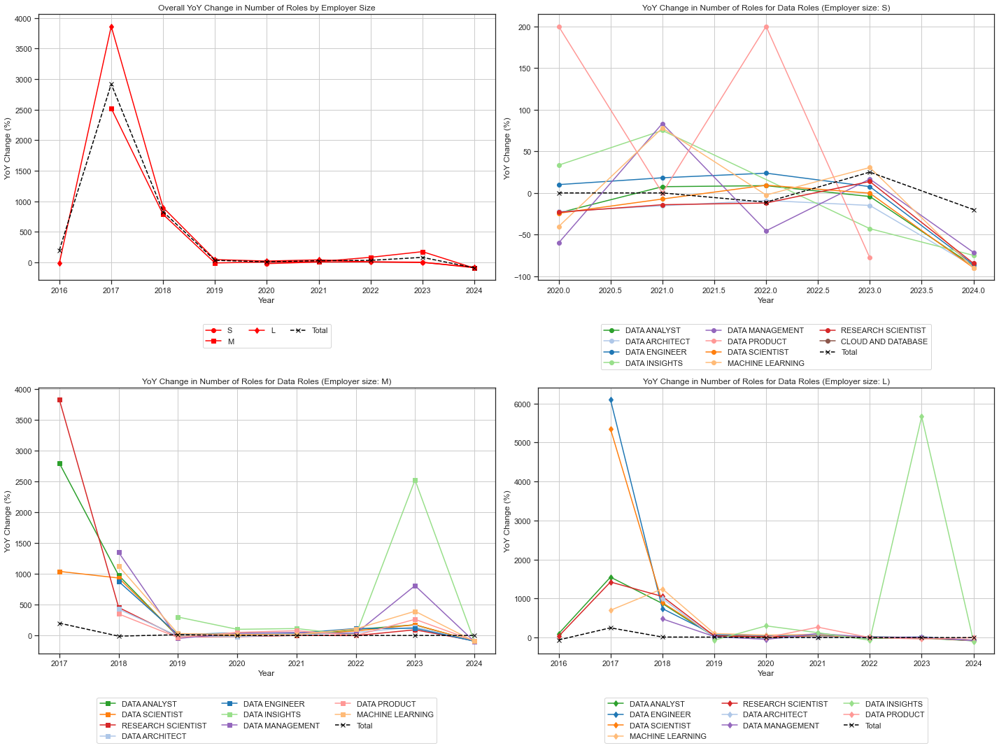

In [27]:
# YoY change in number of roles for employer size across time 
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
cmap = plt.get_cmap("tab20")
unique_roles = all_df["TYPE"].unique()
size_levels = ["S", "M", "L"]
color_map = {role: cmap(i % cmap.N) for i, role in enumerate(unique_roles)}
markers = ['o', 's', 'd']
size_marker_map = {size: marker for size, marker in zip(size_levels, markers)}

# To see overall YoY change in number of roles by employer size
df_plt = all_df.groupby(["YEAR", "EMPLOYER SIZE"]).size().reset_index(name="count")
df_plt["YoY CHANGE"] = df_plt.groupby("EMPLOYER SIZE")["count"].pct_change() * 100
df_total = all_df.groupby("YEAR").size().reset_index(name="count")
df_total["YoY CHANGE"] = df_total["count"].pct_change() * 100

for size in size_levels:
    subset = df_plt[df_plt["EMPLOYER SIZE"] == size]
    axes[0, 0].plot(subset["YEAR"], subset["YoY CHANGE"], marker=size_marker_map[size], label=size, linestyle='-', color='red')

axes[0, 0].plot(df_total["YEAR"], df_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
axes[0, 0].set_title("Overall YoY Change in Number of Roles by Employer Size")
axes[0, 0].set_xlabel("Year")
axes[0, 0].set_ylabel("YoY Change (%)")
axes[0, 0].legend(title="Size")
axes[0, 0].grid(True)
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# To further segregate by data roles within each employer size
df_plt = all_df.groupby(["YEAR", "TYPE", "EMPLOYER SIZE"]).size().reset_index(name="count")
df_plt["YoY CHANGE"] = df_plt.groupby(["TYPE", "EMPLOYER SIZE"])["count"].pct_change() * 100
for i, size in enumerate(size_levels):
    row = (i + 1) // 2
    col = (i + 1) % 2
    df_size = df_plt[df_plt["EMPLOYER SIZE"] == size]
    df_size_total = df_plt[df_plt["EMPLOYER SIZE"] == size].groupby("YEAR").size().reset_index(name="count")
    df_size_total["YoY CHANGE"] = df_size_total["count"].pct_change() * 100

    for role in df_size["TYPE"].unique():
        subset = df_size[df_size["TYPE"] == role]
        axes[row, col].plot(subset["YEAR"], subset["YoY CHANGE"], marker=size_marker_map[size], label=role, color=color_map[role])

    axes[row, col].plot(df_size_total["YEAR"], df_size_total["YoY CHANGE"], marker='x', label='Total', color='black', linestyle='--')
    axes[row, col].set_title(f"YoY Change in Number of Roles for Data Roles (Employer size: {size})")
    axes[row, col].set_xlabel("Year")
    axes[row, col].set_ylabel("YoY Change (%)")
    axes[row, col].legend(title="Role")
    axes[row, col].grid(True)
    axes[row, col].legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()


We see that there has a surge in growth of demand for data roles in 2017 across all companies, and this growth has generally declined over the years, except for a sudden peak in 2023. There has been a negative growth in demand for data roles in 2024, especially so for small companies.

# 5. Feature Importance (replacing NaN values with most frequent class)

## 5ai. Lasso (no ordinal features)

In [28]:
#Classify all categorical features
categorical_features_one_hot = ['EMPLOYER', 'JOB TITLE', 'TYPE', 'COMPANY STATE', 'EMPLOYEE STATE', 'EMPLOYER SIZE', 'EXP', 'EMPLOYMENT TYPE', 'WORK SETTING', 'WORK MODELS']
categorical_features_ordinal = []
numerical_features = ["YEAR","REMOTE RATIO"]

#Pipeline replaces NaN values with most frequent class for categorical features, median values for numerical features
clean_pipeline = get_pipeline_clean_encode_impute(categorical_features_one_hot, categorical_features_ordinal, numerical_features)

In [29]:
#Split into test and train
X, y, X_train, X_test, y_train, y_test = get_standard_train_test_split(full_all_df.dropna(subset=["y"]))

In [30]:
baseline_lr = Pipeline([
    ('clean_pipeline', clean_pipeline),
    ('standard_scaler', StandardScaler()),
    ('lasso_regressor', Lasso(random_state=RANDOM_STATE))
])
baseline_lr.fit(X_train, y_train)
pred = baseline_lr.predict(X_test)

score = mean_absolute_error(pred, y_test)
print('MAE: %.3f (%.3f)' % (score, np.std(pred)))


MAE: 27.127 (29.336)


['EMPLOYEE STATE_UNKNOWN', 'EMPLOYER_UNKNOWN', 'TYPE_MACHINE LEARNING', 'EMPLOYER_FACEBOOK INC', 'EMPLOYER_META PLATFORMS INC', 'YEAR', 'EMPLOYEE STATE_CA', 'COMPANY STATE_CA', 'TYPE_DATA ANALYST', 'EXP_SENIOR']


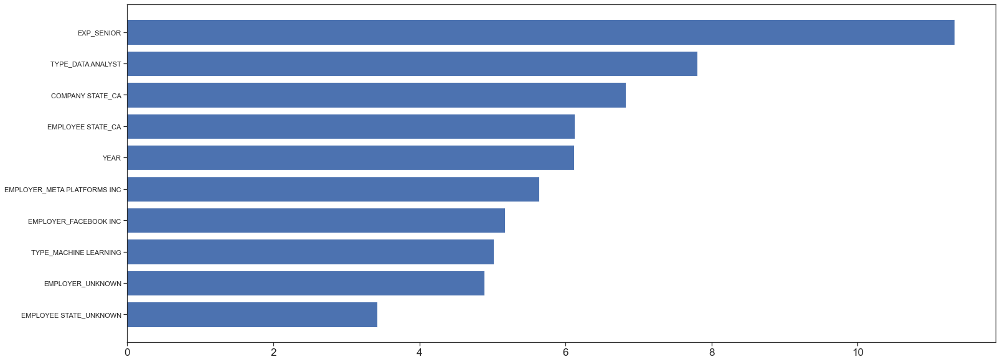

In [31]:
X_train_cleaned = clean_pipeline.fit_transform(X_train)

# get importance
importance = np.abs(baseline_lr['lasso_regressor'].coef_)
features = list(X_train_cleaned.columns)

# get index of top N important values
n = 10
indexes = sorted(range(len(importance)), key=lambda i: importance[i])[-n:]
impt_features = []
impt_features_score = []
# summarize feature importance
for i in indexes:
    impt_features.append(features[i])
    impt_features_score.append(importance[i])
# plot feature importance
plt.figure(figsize=(25,10))
plt.xticks(fontsize=17)

print(impt_features)
plt.barh(impt_features, impt_features_score)
plt.show()


## 5aii. Decision Tree (no ordinal features)

In [32]:
tree_lr = Pipeline([
    ('clean_pipeline', clean_pipeline),
    ('standard_scaler', StandardScaler()),
    ('DecisionTreeRegressor', DecisionTreeRegressor(criterion='friedman_mse', max_depth=5, min_samples_leaf=5, random_state=RANDOM_STATE))
])

tree_lr.fit(X_train, y_train)
pred = tree_lr.predict(X_test)

score = mean_absolute_error(pred, y_test)
print('MAE: %.3f (%.3f)' % (score, np.std(pred)))

MAE: 28.532 (31.200)


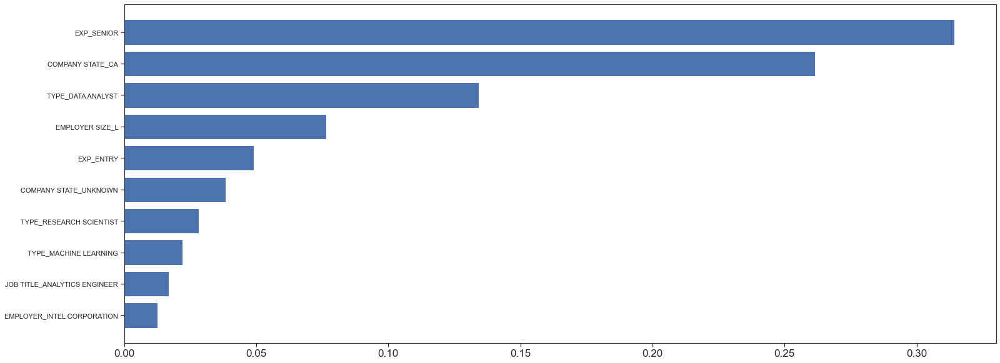

In [33]:
# get importance
tree_lr.fit(X_train, y_train)
X_train_cleaned = clean_pipeline.fit_transform(X_train)

importance = tree_lr['DecisionTreeRegressor'].feature_importances_
features = list(X_train_cleaned.columns)

# get index of top N important values
n = 10
indexes = sorted(range(len(importance)), key=lambda i: importance[i])[-n:]
impt_features = []
impt_features_score = []
# summarize feature importance
for i in indexes:
    impt_features.append(features[i])
    impt_features_score.append(importance[i])
# plot feature importance
plt.figure(figsize=(25,10))
plt.xticks(fontsize=17)

plt.barh(impt_features, impt_features_score)
plt.show()

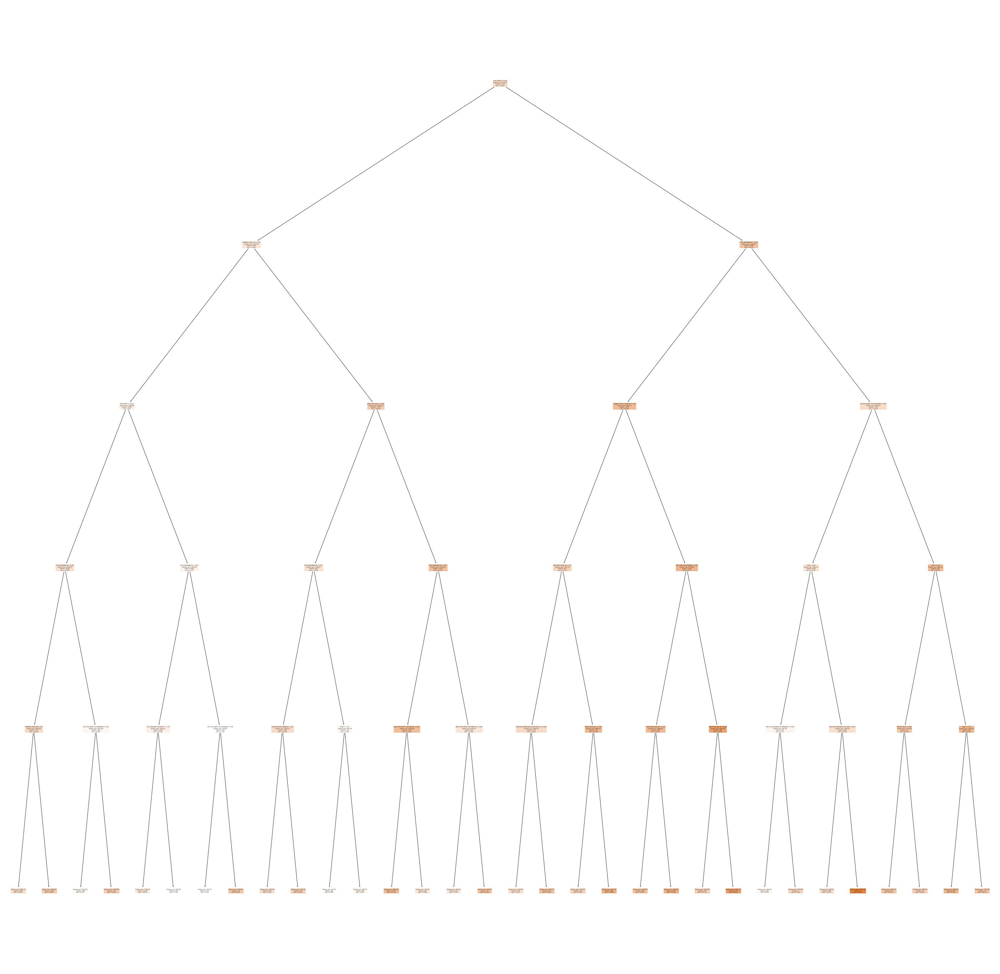

In [34]:
fig = plt.figure(figsize=(50,50))
_ = plot_tree(tree_lr['DecisionTreeRegressor'],
              feature_names=X_train_cleaned.columns,
              class_names=['0','1'],
              filled=True)

## 5 bi. Lasso (w ordinal features)

In [35]:
#Classify categorical features  and ordinal features
categorical_features_one_hot = ['EMPLOYER', 'JOB TITLE', 'TYPE', 'COMPANY STATE', 'EMPLOYEE STATE',  'EMPLOYMENT TYPE', 'WORK SETTING']
categorical_features_ordinal = ['EMPLOYER SIZE', 'EXP']
numerical_featurexs = ["YEAR","REMOTE RATIO"]

#Pipeline replaces NaN values with most frequent class for categorical features, median values for numerical features
clean_pipeline = get_pipeline_clean_encode_impute(categorical_features_one_hot, categorical_features_ordinal, numerical_features)

In [36]:
#Split into test and train
X, y, X_train, X_test, y_train, y_test = get_standard_train_test_split(full_all_df.dropna(subset=["y"]))

In [37]:
baseline_lr = Pipeline([
    ('clean_pipeline', clean_pipeline),
    ('standard_scaler', StandardScaler()),
    ('lasso_regressor', Lasso(random_state=RANDOM_STATE))
])
baseline_lr.fit(X_train, y_train)
pred = baseline_lr.predict(X_test)

score = mean_absolute_error(pred, y_test)
print('MAE: %.3f (%.3f)' % (score, np.std(pred)))
# n_scores = cross_val_score(baseline_lr, X_train, y_train, scoring='neg_mean_absolute_error', cv=5)
# models_performance["Baseline"] = [abs(np.mean(n_scores)), np.std(n_scores)]
# # report performance
# print('MAE: %.3f (%.3f)' % (abs(np.mean(n_scores)), np.std(n_scores)))

MAE: 27.240 (29.138)


['EMPLOYEE STATE_UNKNOWN', 'EMPLOYER_UNKNOWN', 'TYPE_MACHINE LEARNING', 'EMPLOYER_FACEBOOK INC', 'EMPLOYER_META PLATFORMS INC', 'YEAR', 'EMPLOYEE STATE_CA', 'COMPANY STATE_CA', 'TYPE_DATA ANALYST', 'EXP']


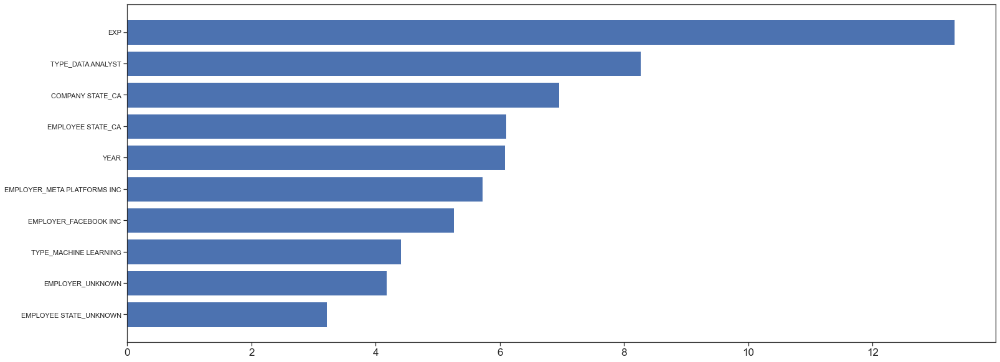

In [38]:
baseline_lr.fit(X_train, y_train)
X_train_cleaned = clean_pipeline.fit_transform(X_train)

# get importance
importance = np.abs(baseline_lr['lasso_regressor'].coef_)
features = list(X_train_cleaned.columns)

# get index of top N important values
n = 10
indexes = sorted(range(len(importance)), key=lambda i: importance[i])[-n:]
impt_features = []
impt_features_score = []
# summarize feature importance
for i in indexes:
    impt_features.append(features[i])
    impt_features_score.append(importance[i])
# plot feature importance
plt.figure(figsize=(25,10))
plt.xticks(fontsize=17)

print(impt_features)
plt.barh(impt_features, impt_features_score)
plt.show()


## 5bii. Decision Tree (w ordinal features)

In [39]:
tree_lr = Pipeline([
    ('clean_pipeline', clean_pipeline),
    ('standard_scaler', StandardScaler()),
    ('DecisionTreeRegressor', DecisionTreeRegressor(criterion='friedman_mse', max_depth=5, min_samples_leaf=5, random_state=RANDOM_STATE))
])

tree_lr.fit(X_train, y_train)
pred = tree_lr.predict(X_test)

score = mean_absolute_error(pred, y_test)
print('MAE: %.3f (%.3f)' % (score, np.std(pred)))

# n_scores = cross_val_score(tree_lr, X_train, y_train, scoring='neg_mean_absolute_error', cv=5)
# models_performance["DecisionTreeRegressor"] = [abs(np.mean(n_scores)), np.std(n_scores)]
# # report performance
# print('MAE: %.3f (%.3f)' % (abs(np.mean(n_scores)), np.std(n_scores)))

MAE: 28.530 (31.184)


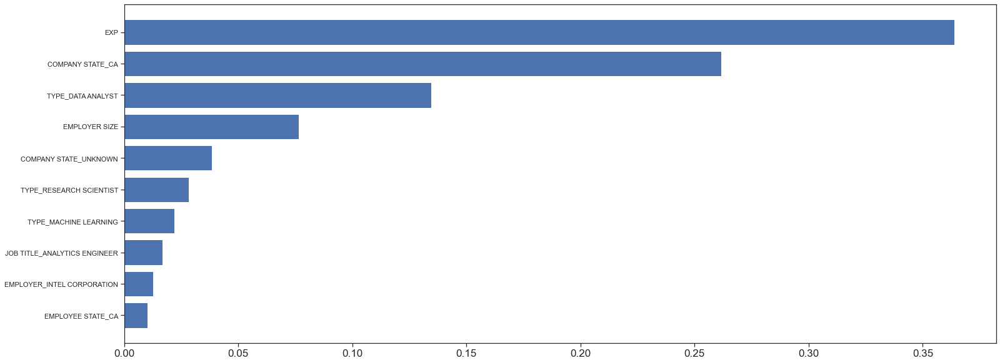

In [40]:
# get importance
tree_lr.fit(X_train, y_train)
X_train_cleaned = clean_pipeline.fit_transform(X_train)

importance = tree_lr['DecisionTreeRegressor'].feature_importances_
features = list(X_train_cleaned.columns)

# get index of top N important values
n = 10
indexes = sorted(range(len(importance)), key=lambda i: importance[i])[-n:]
impt_features = []
impt_features_score = []
# summarize feature importance
for i in indexes:
    impt_features.append(features[i])
    impt_features_score.append(importance[i])
# plot feature importance
plt.figure(figsize=(25,10))
plt.xticks(fontsize=17)

plt.barh(impt_features, impt_features_score)
plt.show()

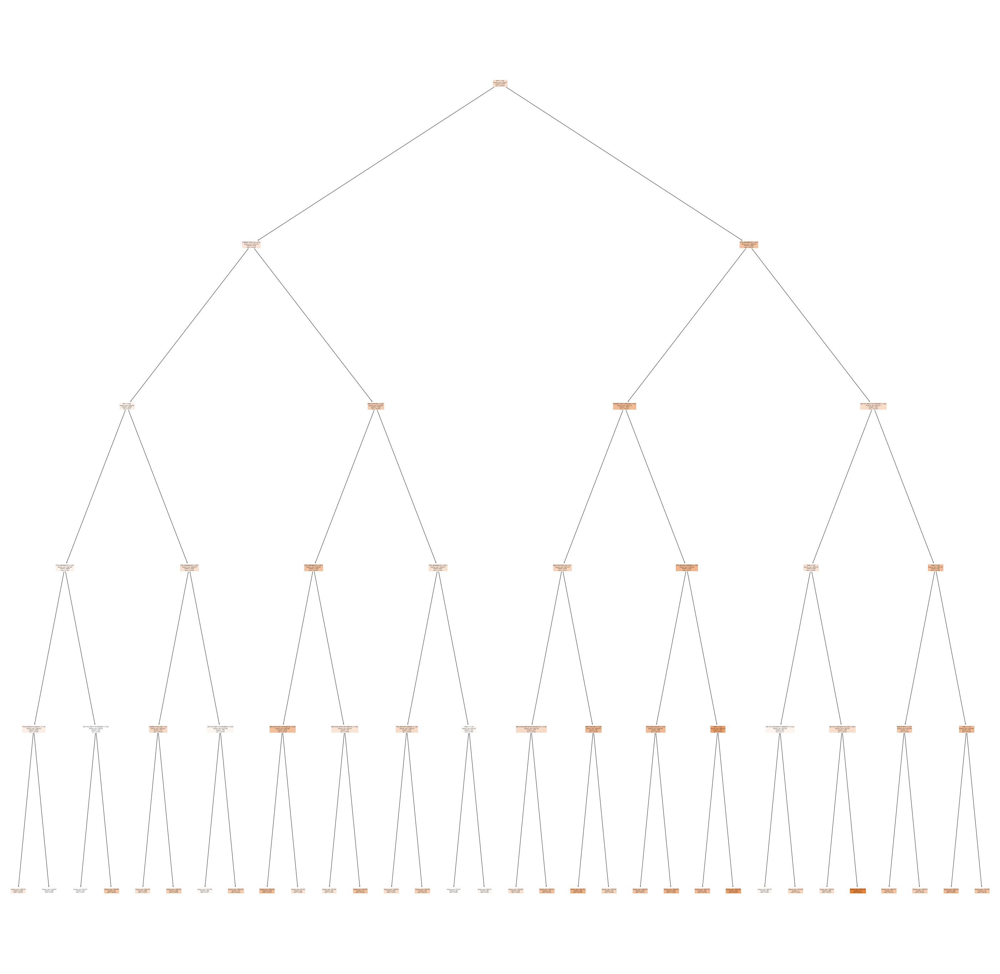

In [41]:
fig = plt.figure(figsize=(50,50))
_ = plot_tree(tree_lr['DecisionTreeRegressor'],
              feature_names=X_train_cleaned.columns,
              class_names=['0','1'],
              filled=True)

# 6. Feature Importance (generating a new class from NaN values)

## 6ai. Lasso (no ordinal features)

In [42]:
# Classify categorical features  and ordinal features
categorical_features_one_hot = ['EMPLOYER', 'JOB TITLE', 'TYPE', 'COMPANY LOCATION', 'COMPANY STATE', 'EMPLOYEE LOCATION', 'EMPLOYEE STATE', 'EMPLOYER SIZE', 'EXP', 'EMPLOYMENT TYPE', 'WORK SETTING', 'WORK MODELS']
categorical_features_ordinal = []
numerical_features = ["YEAR","REMOTE RATIO"]

# Create a new class for NaN values
full_all_df_fill_na = full_all_df.copy()
full_all_df_fill_na[categorical_features_one_hot + categorical_features_ordinal] = full_all_df_fill_na[categorical_features_one_hot + categorical_features_ordinal].fillna("Unknown")

clean_pipeline = get_pipeline_clean_encode_impute(categorical_features_one_hot, categorical_features_ordinal, numerical_features)

In [43]:
#Split into test and train
X, y, X_train, X_test, y_train, y_test = get_standard_train_test_split(full_all_df_fill_na.dropna(subset=["y"]))

In [44]:
baseline_lr = Pipeline([
  ('clean_pipeline', clean_pipeline),
  ('standard_scaler', StandardScaler()),
  ('lasso_regressor', Lasso(random_state=RANDOM_STATE))
])
baseline_lr.fit(X_train, y_train)
pred = baseline_lr.predict(X_test)

score = mean_absolute_error(pred, y_test)
print('MAE: %.3f (%.3f)' % (score, np.std(pred)))

MAE: 26.326 (30.618)


['EMPLOYER_FACEBOOK INC', 'EMPLOYER_META PLATFORMS INC', 'YEAR', 'TYPE_MACHINE LEARNING', 'EMPLOYEE STATE_CA', 'COMPANY STATE_CA', 'TYPE_DATA ANALYST', 'EMPLOYEE LOCATION_UNITED STATES', 'EXP_SENIOR', 'EMPLOYMENT TYPE_FT']


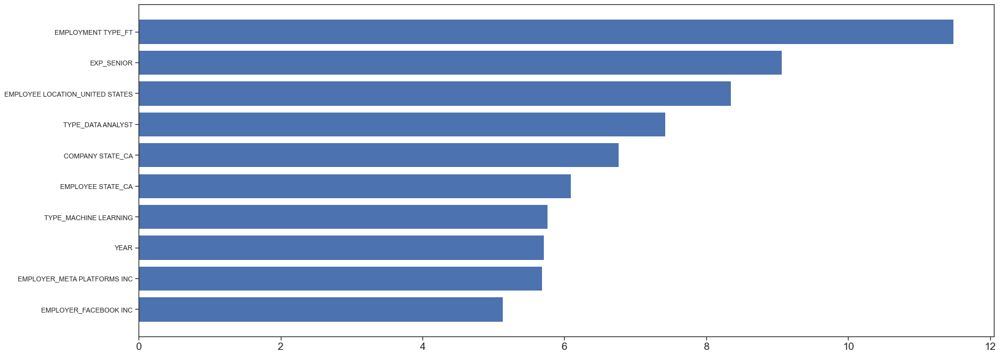

In [45]:
baseline_lr.fit(X_train, y_train)
X_train_cleaned = clean_pipeline.fit_transform(X_train)

# get importance
importance = np.abs(baseline_lr['lasso_regressor'].coef_)
features = list(X_train_cleaned.columns)

# get index of top N important values
n = 10
indexes = sorted(range(len(importance)), key=lambda i: importance[i])[-n:]
impt_features = []
impt_features_score = []
# summarize feature importance
for i in indexes:
 impt_features.append(features[i])
 impt_features_score.append(importance[i])
# plot feature importance
plt.figure(figsize=(25,10))
plt.xticks(fontsize=17)

print(impt_features)
plt.barh(impt_features, impt_features_score)
plt.show()


## 6aii. Decision Tree (no ordinal features)

In [46]:
tree_lr = Pipeline([
    ('clean_pipeline', clean_pipeline),
    ('standard_scaler', StandardScaler()),
    ('DecisionTreeRegressor', DecisionTreeRegressor(criterion='friedman_mse', max_depth=5, min_samples_leaf=5, random_state=RANDOM_STATE))
])

tree_lr.fit(X_train, y_train)
pred = tree_lr.predict(X_test)

score = mean_absolute_error(pred, y_test)
print('MAE: %.3f (%.3f)' % (score, np.std(pred)))

MAE: 28.089 (32.014)


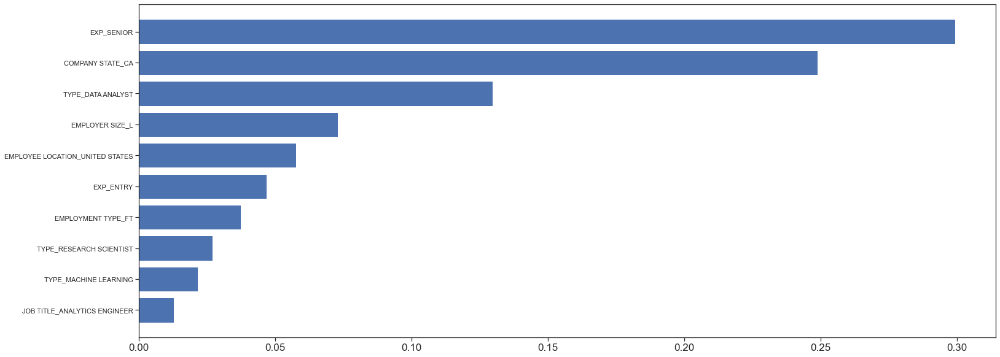

In [47]:
# get importance
tree_lr.fit(X_train, y_train)
X_train_cleaned = clean_pipeline.fit_transform(X_train)

importance = tree_lr['DecisionTreeRegressor'].feature_importances_
features = list(X_train_cleaned.columns)

# get index of top N important values
n = 10
indexes = sorted(range(len(importance)), key=lambda i: importance[i])[-n:]
impt_features = []
impt_features_score = []
# summarize feature importance
for i in indexes:
 impt_features.append(features[i])
 impt_features_score.append(importance[i])
# plot feature importance
plt.figure(figsize=(25,10))
plt.xticks(fontsize=17)

plt.barh(impt_features, impt_features_score)
plt.show()

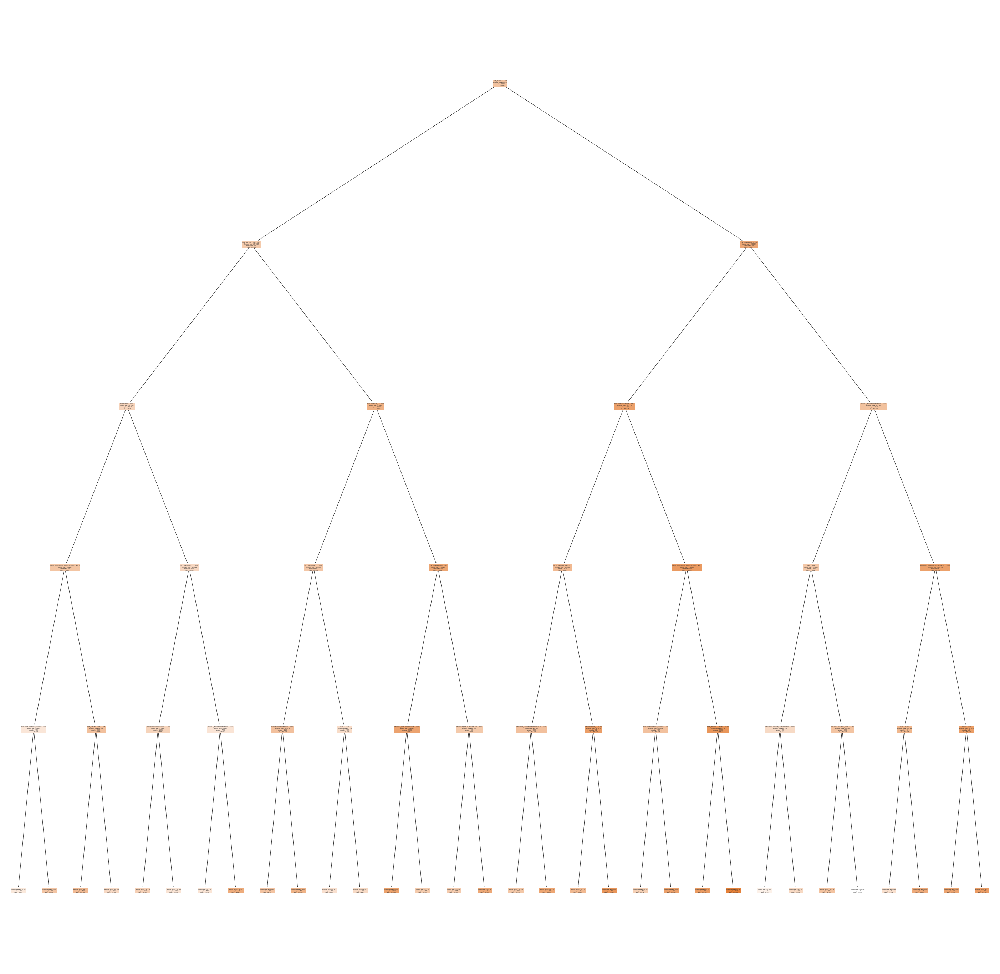

In [48]:
fig = plt.figure(figsize=(50,50))
_ = plot_tree(tree_lr['DecisionTreeRegressor'], 
                   feature_names=X_train_cleaned.columns,  
                   class_names=['0','1'],
                   filled=True)

## 6bi. Lasso (w ordinal features)

In [49]:
# Classify categorical features  and ordinal features
categorical_features_one_hot = ['EMPLOYER', 'JOB TITLE', 'TYPE', 'COMPANY STATE', 'EMPLOYEE STATE',  'EMPLOYMENT TYPE', 'WORK SETTING']
categorical_features_ordinal = ['EMPLOYER SIZE', 'EXP']
numerical_features = ["YEAR","REMOTE RATIO"]

clean_pipeline = get_pipeline_clean_encode_impute(categorical_features_one_hot, categorical_features_ordinal, numerical_features)

In [50]:
#Split into test and train
X, y, X_train, X_test, y_train, y_test = get_standard_train_test_split(full_all_df_fill_na.dropna(subset=["y"]))

In [51]:
baseline_lr = Pipeline([
  ('clean_pipeline', clean_pipeline),
  ('standard_scaler', StandardScaler()),
  ('lasso_regressor', Lasso(random_state=RANDOM_STATE))
])
baseline_lr.fit(X_train, y_train)
pred = baseline_lr.predict(X_test)

score = mean_absolute_error(pred, y_test)
print('MAE: %.3f (%.3f)' % (score, np.std(pred)))

MAE: 27.231 (29.164)


['EMPLOYER_GOOGLE LLC', 'TYPE_MACHINE LEARNING', 'EMPLOYER_FACEBOOK INC', 'EMPLOYER_META PLATFORMS INC', 'YEAR', 'EMPLOYEE STATE_CA', 'COMPANY STATE_CA', 'EMPLOYMENT TYPE_FT', 'TYPE_DATA ANALYST', 'EXP']


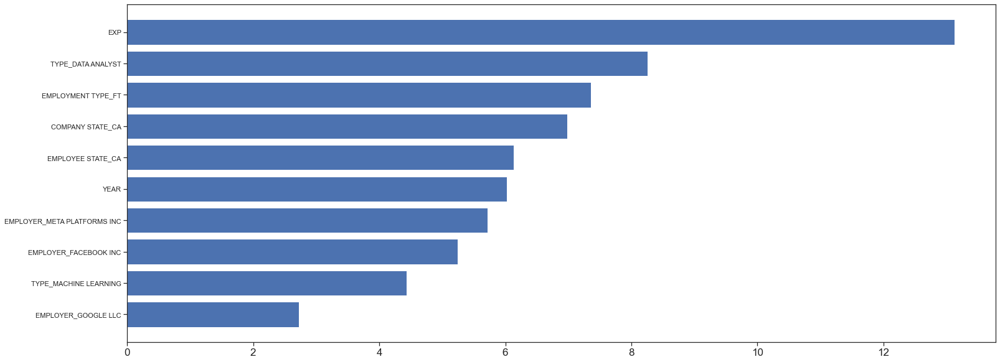

In [52]:
baseline_lr.fit(X_train, y_train)
X_train_cleaned = clean_pipeline.fit_transform(X_train)

# get importance
importance = np.abs(baseline_lr['lasso_regressor'].coef_)
features = list(X_train_cleaned.columns)

# get index of top N important values
n = 10
indexes = sorted(range(len(importance)), key=lambda i: importance[i])[-n:]
impt_features = []
impt_features_score = []
# summarize feature importance
for i in indexes:
 impt_features.append(features[i])
 impt_features_score.append(importance[i])
# plot feature importance
plt.figure(figsize=(25,10))
plt.xticks(fontsize=17)

print(impt_features)
plt.barh(impt_features, impt_features_score)
plt.show()


## 6bii. Decision Tree (w ordinal features)

In [53]:
tree_lr = Pipeline([
    ('clean_pipeline', clean_pipeline),
    ('standard_scaler', StandardScaler()),
    ('DecisionTreeRegressor', DecisionTreeRegressor(criterion='friedman_mse', max_depth=5, min_samples_leaf=5, random_state=RANDOM_STATE))
])

tree_lr.fit(X_train, y_train)
pred = tree_lr.predict(X_test)

score = mean_absolute_error(pred, y_test)
print('MAE: %.3f (%.3f)' % (score, np.std(pred)))

MAE: 28.513 (31.194)


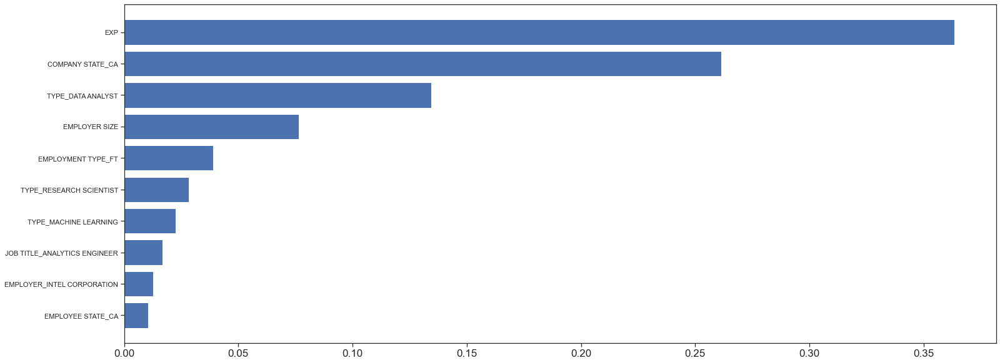

In [54]:
# get importance
tree_lr.fit(X_train, y_train)
X_train_cleaned = clean_pipeline.fit_transform(X_train)

importance = tree_lr['DecisionTreeRegressor'].feature_importances_
features = list(X_train_cleaned.columns)

# get index of top N important values
n = 10
indexes = sorted(range(len(importance)), key=lambda i: importance[i])[-n:]
impt_features = []
impt_features_score = []
# summarize feature importance
for i in indexes:
 impt_features.append(features[i])
 impt_features_score.append(importance[i])
# plot feature importance
plt.figure(figsize=(25,10))
plt.xticks(fontsize=17)

plt.barh(impt_features, impt_features_score)
plt.show()

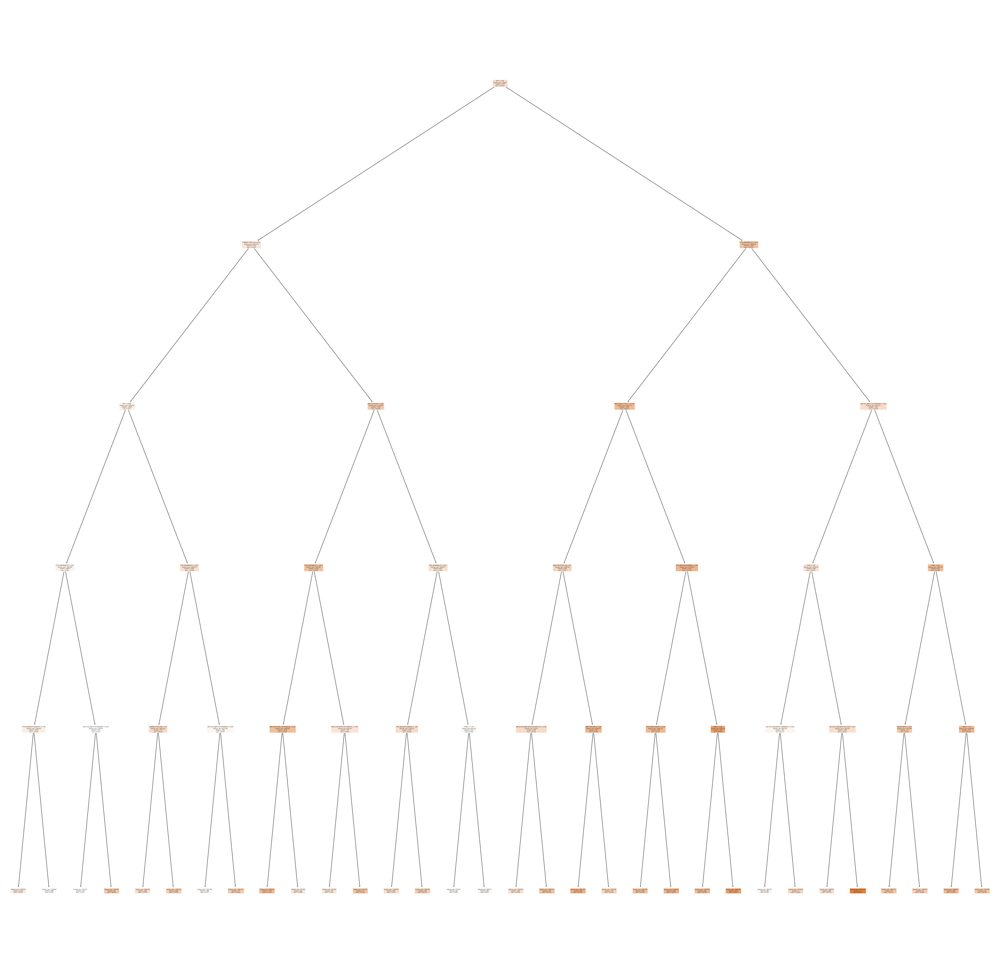

In [55]:
fig = plt.figure(figsize=(50,50))
_ = plot_tree(tree_lr['DecisionTreeRegressor'], 
                   feature_names=X_train_cleaned.columns,  
                   class_names=['0','1'],
                   filled=True)